#### Installation des packages

In [1]:
!pip install tensorflow
!python -m pip install plotnine
!pip install plotly.express
!pip install wordcloud
!pip install -U spacy
!pip install keras==2.9
!pip install mlxtend

  Using cached keras-2.11.0-py2.py3-none-any.whl (1.7 MB)
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Using cached keras-2.9.0-py2.py3-none-any.whl (1.6 MB)
  Attempting uninstall: keras
    Found existing installation: keras 2.11.0
    Uninstalling keras-2.11.0:
      Successfully uninstalled keras-2.11.0


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.11.0 requires keras<2.12,>=2.11.0, but you have keras 2.9.0 which is incompatible.


#### Librairies

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from collections import Counter
import string
import warnings
import plotly.express as px
import plotnine
from plotnine import *

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation , NMF, PCA, TruncatedSVD
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, KFold
from sklearn import metrics, neighbors, tree
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
from sklearn.preprocessing import label_binarize, LabelEncoder  
from sklearn.metrics import classification_report, balanced_accuracy_score, confusion_matrix
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.linear_model import SGDClassifier, RidgeClassifier, PassiveAggressiveClassifier, LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC , LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans, MiniBatchKMeans

from scipy.sparse import csr_matrix

from wordcloud import WordCloud, STOPWORDS

from mlxtend.frequent_patterns import apriori, association_rules

import tensorflow
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

import spacy

import gensim
from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument


"""
import nltk
nltk.download("punkt")
nltk.download("stopwords")
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from nltk.probability import FreqDist
"""

from nltk.tokenize import word_tokenize



#stop_words = set(stopwords.words('french'))

C:\Users\aberthe\Anaconda3\lib\site-packages\keras\utils\image_utils.py:36: DeprecationWarning: NEAREST is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
C:\Users\aberthe\Anaconda3\lib\site-packages\keras\utils\image_utils.py:37: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
C:\Users\aberthe\Anaconda3\lib\site-packages\keras\utils\image_utils.py:38: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
C:\Users\aberthe\Anaconda3\lib\site-packages\keras\utils\image_utils.py:39: DeprecationWarning: HAMMING is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.HAMMING instead.
C:\Users\aberthe\Anaconda3\lib\site-packages\keras\utils\image_utils.py:40: DeprecationWarning: BOX is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BOX instead.
C:\Use

#### Telechargement du modele __fr_core_news_sm__ spacy

In [3]:
!python -m spacy download fr_core_news_sm

     --------------------------------------- 16.3/16.3 MB 15.6 MB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('fr_core_news_sm')


#### Options d'affichage

In [4]:
%matplotlib inline
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', 500)
warnings.filterwarnings("ignore")

In [5]:
os.listdir('../data/in')

['131222_data_prepared.csv',
 'data_clean.csv',
 'data_credit.xlsx',
 'data_prepared.csv']

#### Lecture de nos données

In [6]:
data_prepared = pd.read_csv('../data/in/data_clean.csv' , sep = ';' , index_col=0).reset_index()
print(data_prepared.shape)
data_prepared.head()

(9559, 7)


,index,number,priority,assignment_group,product,nb_echanges,first_msg_ortho_stopW_synonyme
0,0,CS0012206,4 - Low,Support hébergement,Hébergement Divers,24,certificat ssl expire courant service renouvel...
1,1,CS0012216,2 - High,Support N2 Capdemat,Support de fonctionnement,4,compte associés brulé tenté connexion succès d...
2,2,CS0012220,2 - High,Support de fonctionnement applicatif,Support de fonctionnement,3,adresse siège social gazechim plastic modifiée...
3,3,CS0012226,2 - High,Support de fonctionnement applicatif,Certificat SSL,8,adresse_mail adherent rencontrent modification...
4,4,CS0012230,2 - High,Equipe Webmarketing,Webmarketing,2,reçue adherent soulevé diffusion biens apparai...


In [7]:
# Quelques infos sur notre dataset

data_prepared.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9559 entries, 0 to 9558
Data columns (total 7 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   index                           9559 non-null   int64 
 1   number                          9559 non-null   object
 2   priority                        9559 non-null   object
 3   assignment_group                9466 non-null   object
 4   product                         9353 non-null   object
 5   nb_echanges                     9559 non-null   int64 
 6   first_msg_ortho_stopW_synonyme  9483 non-null   object
dtypes: int64(2), object(5)
memory usage: 522.9+ KB


In [8]:
# Identifier les colonnes avec des valeurs manquantes

data_prepared.isna().sum()

index                               0
number                              0
priority                            0
assignment_group                   93
product                           206
nb_echanges                         0
first_msg_ortho_stopW_synonyme     76
dtype: int64

In [9]:
# On ne travaille que sur les donnees pour lesquelles on a la 
# description du ticket et l'assignment_group de renseigner

data_prepared = data_prepared[data_prepared.first_msg_ortho_stopW_synonyme.notna() &
                              data_prepared.assignment_group.notna()]
print(data_prepared.shape)

(9391, 7)


#### Lemmatisation des mots avec Spacy et nltk

In [10]:
# Chargement du modele fr_core_news_sm de spacy pour la lemitisation
# Choix de spacy plutot que nltk que spacy est repute meilleur que nltk pour le traitement du français
# Malgré tout les performances de spacy restent limitées

nlp = spacy.load("fr_core_news_sm")

In [11]:
#from nltk.stem.snowball import SnowballStemmer
#stemmer = SnowballStemmer(language='french')

# Fonction qui renvoie pour chaque token sa forme lemmatisée.
def return_lem(sentence):
    doc = nlp(sentence)
    #return [stemmer.stem(X.text) for X in doc]
    return [token.lemma_ for token in doc]

In [12]:
# On "lemmatise" la colonne first_msg_ortho_stopW_synonyme
# Nadir a rapproché les mots sur la base de la distance de Levenshtein 
# (travailler avec son data set pour eviter la lematisation)

data_prepared['lem_tokens'] = data_prepared['first_msg_ortho_stopW_synonyme'].apply(return_lem)
data_prepared['lem_text'] = data_prepared['lem_tokens'].apply(lambda x : ' '.join(x))
data_prepared.head(3)

,index,number,priority,assignment_group,product,nb_echanges,first_msg_ortho_stopW_synonyme,lem_tokens,lem_text
0,0,CS0012206,4 - Low,Support hébergement,Hébergement Divers,24,certificat ssl expire courant service renouvel...,"[certificat, ssl, expir, courant, service, ren...",certificat ssl expir courant service renouvell...
1,1,CS0012216,2 - High,Support N2 Capdemat,Support de fonctionnement,4,compte associés brulé tenté connexion succès d...,"[compte, associer, bruler, tenter, connexion, ...",compte associer bruler tenter connexion succè ...
2,2,CS0012220,2 - High,Support de fonctionnement applicatif,Support de fonctionnement,3,adresse siège social gazechim plastic modifiée...,"[adresse, sièg, social, gazechim, plastic, mod...",adresse sièg social gazechim plastic modifier ...


In [13]:
#data_prepared.to_csv('131222_data_prepared.csv' , index=False)

#### Nombre d'enregistrements par assignment group

In [14]:
# Analyse de la colonne assignment_group pour checker le nombre d'enregistrements par assignment_group.
# On a pas mal de groupe avec 1,2,3 ou quatres enregistrements pas assez pour entrainer un modele à reconnaitre ses classes.
# Faudrait les regrouper entre elles ou les rajouter à d'autres classes

print("Nombre d'assignment group :" , data_prepared['assignment_group'].nunique())
data_prepared['assignment_group'].value_counts()

Nombre d'assignment group : 38


Support hébergement                                     2928
Support de fonctionnement applicatif                    1307
Chefs de projets Techniques hébergement                  850
Support Nom de Domaine                                   781
Support Certificats SSL                                  603
Support CSI (N2 LX) hébergement                          406
Support N2 Symfony / e-commerce                          314
Chefs de projets Solution (SDM) hébergement              314
Support Serviciels                                       303
Support DCM hébergement                                  279
Support CSI (N2 MS) hébergement                          218
Support N2 Jalios                                        140
Support Achatville                                       135
Support N2 CMS.eolas                                     100
Support N2 Drupal                                         90
Support COSSI (N2 Sécurité) hébergement                   89
Support Réseau (NET) héb

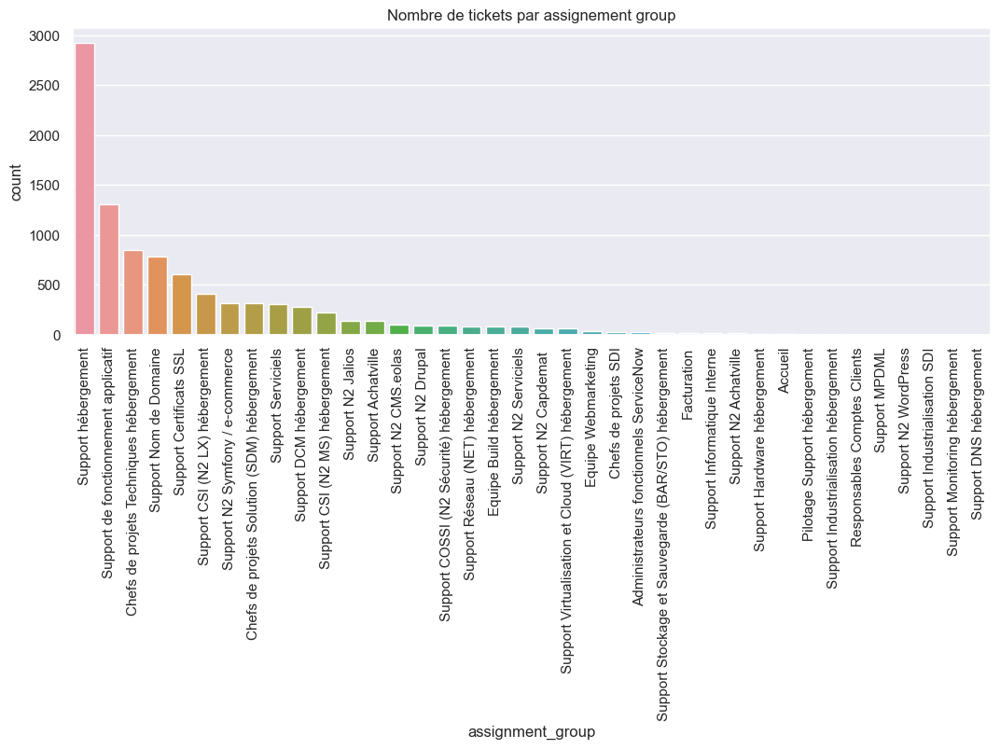

In [15]:
sns.set(rc={'figure.figsize':(12.7,4.27)})
sns.countplot(x = 'assignment_group',
              data = data_prepared,
              order = data_prepared['assignment_group'].value_counts().index).set_title("Nombre de tickets par assignement group")
plt.xticks(rotation = 90)
plt.show()

In [16]:
#sns.set(rc={'figure.figsize':(12.7,4.27)})
#sns.countplot(x = 'priority',
#              data = data_prepared,
#              order = data_prepared['priority'].value_counts().index).set_title("Nombre de tickets par priority")
#plt.xticks(rotation = 90)
#plt.show()

In [17]:
#pd.crosstab(data_prepared['assignment_group'] , 
#            data_prepared['priority'])

In [18]:
#sns.countplot(x = 'assignment_group',
#              hue = 'priority',
#              data = data_prepared)
#plt.xticks(rotation = 90)
#plt.show()

In [19]:
# Fonction qui renvoit le nombre de tokens par ticket

plotnine.options.figure_size = (16, 8) 

def gg_histogram(df, x, x_lab = "", y_lab = "", title = "", binwidth = 70):

    gg = (ggplot(df, aes(x)) +
             geom_histogram(binwidth = binwidth) +
             labs(x = x_lab, y = y_lab, title = title) +
             theme_538())
    return(gg)

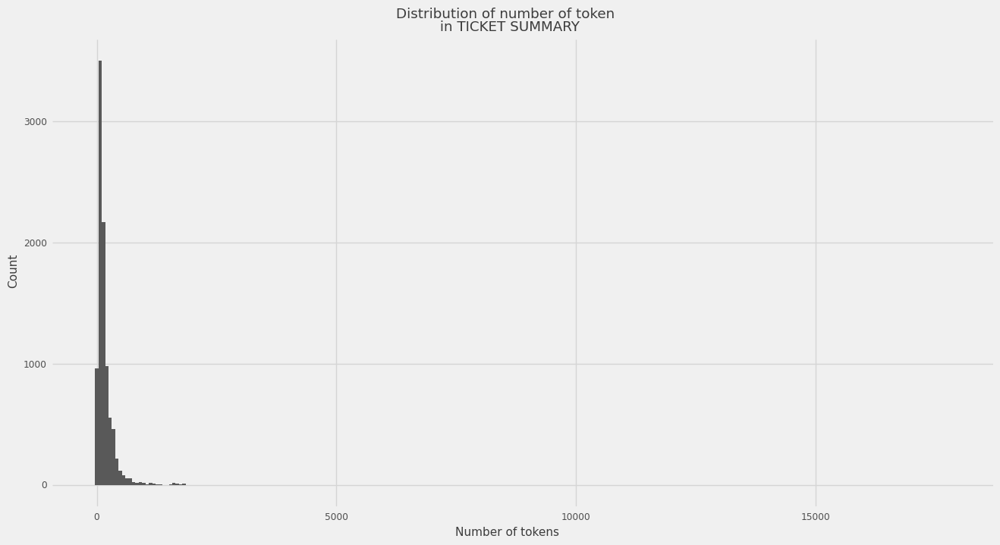

<ggplot: (78937455345)>

In [20]:
df = data_prepared.first_msg_ortho_stopW_synonyme.apply(len).to_frame(name = "length")

gg_histogram(df,
             'length',
             'Number of tokens',
             'Count',
             'Distribution of number of token \n in TICKET SUMMARY')

In [21]:
df['length'].describe()

count     9391.000000
mean       183.492493
std        394.414637
min          3.000000
25%         64.000000
50%        111.000000
75%        199.000000
max      17790.000000
Name: length, dtype: float64

In [22]:
# Ici on a croise la longeur du ticket avec la classe du ticket pour checker 
# si le nombre de tokens dans un ticket differe d'un assignment_group à un autre
# Faire un test statistique pour vérifier la significativité du lien

#sns.boxplot(x = 'assignment_group',
#            y = 'len_first_msg',
#            data = data_prepared[data_prepared.len_first_msg <= 1000])
#plt.xticks(rotation = 90)
#plt.show()

#### Analyse des __mots rares__ et des __mots frequents__

In [23]:
seuil = 50 # seuil au delà duquel un mot est consideré comme fréquent
cnt=0
tot_cnt=0
freq=0
tot_freq=0

In [24]:
# Tockenizer les données 

the_tokenizer = Tokenizer()
the_tokenizer.fit_on_texts(list(np.array(data_prepared['lem_text'])))

In [25]:
# Calcule le taux de mots rares (moins de 50 occurences) dans le texte 
# Calcule le taux de couverture des mots rares dans le corpus documentaire

for key,value in the_tokenizer.word_counts.items():
    tot_cnt=tot_cnt+1
    tot_freq=tot_freq+value
    if(value<seuil):
        cnt=cnt+1
        freq=freq+value
    
print("% of rare words in vocabulary:",(cnt/tot_cnt)*100)
print("Total Coverage of rare words:",(freq/tot_freq)*100)

% of rare words in vocabulary: 96.73826991080382
Total Coverage of rare words: 37.5661741967941


In [26]:
# Les mots les plus frequents

sorted(the_tokenizer.word_counts.items(), key=lambda x:x[1] , reverse=True)[:30]

[('adresse', 9060),
 ('ip', 5363),
 ('serveur', 3772),
 ('information', 3419),
 ('mail', 2995),
 ('gt', 2315),
 ('systeme', 2094),
 ('certificat', 1995),
 ('domaine', 1896),
 ('production', 1874),
 ('acce', 1837),
 ('eddv', 1478),
 ('service', 1437),
 ('ssl', 1389),
 ('erreur', 1186),
 ('de', 1139),
 ('page', 1088),
 ('connexion', 1057),
 ('preproduction', 1008),
 ('donnee', 852),
 ('port', 779),
 ('base', 761),
 ('intervention', 712),
 ('redemarrage', 706),
 ('amp', 696),
 ('environnement', 689),
 ('message', 671),
 ('plateform', 663),
 ('modification', 655),
 ('identifiant', 646)]

In [27]:
# Les mots les plus rares

sorted(the_tokenizer.word_counts.items(), key=lambda x:x[1] , reverse=False)[:30]

[('bruler', 1),
 ('dépit', 1),
 ('institutric', 1),
 ('plastic', 1),
 ('brisson', 1),
 ('bézier', 1),
 ('bellignat', 1),
 ('apparaisson', 1),
 ('toproceed', 1),
 ('tfd', 1),
 ('déphasage', 1),
 ('hampe', 1),
 ('inetumcom', 1),
 ('abspowertxt', 1),
 ('refonctionne', 1),
 ('tcrsyslog', 1),
 ('mbferp', 1),
 ('déstockage', 1),
 ('barrer', 1),
 ('clarifier', 1),
 ('cycle', 1),
 ('cherch', 1),
 ('castest', 1),
 ('terrer', 1),
 ('vivant', 1),
 ('cmsv', 1),
 ('peugeot', 1),
 ('motocycle', 1),
 ('bdemalglaiv', 1),
 ('jms', 1)]

#### __WordCloud__ -- Nuage de mots par ticket

In [28]:
# Lael Encoder for mapping assignment_group with a number

labeler = LabelEncoder()
data_prepared["target"] = labeler.fit_transform(data_prepared["assignment_group"])

In [29]:
# Show mapping

mapping = dict(zip(labeler.classes_, range(len(labeler.classes_))))
print(mapping)

{'Accueil': 0, 'Administrateurs fonctionnels ServiceNow': 1, 'Chefs de projets SDI': 2, 'Chefs de projets Solution (SDM) hébergement': 3, 'Chefs de projets Techniques hébergement': 4, 'Equipe Build hébergement': 5, 'Equipe Webmarketing': 6, 'Facturation': 7, 'Pilotage Support hébergement': 8, 'Responsables Comptes Clients': 9, 'Support Achatville': 10, 'Support COSSI (N2 Sécurité) hébergement': 11, 'Support CSI (N2 LX) hébergement': 12, 'Support CSI (N2 MS) hébergement': 13, 'Support Certificats SSL': 14, 'Support DCM hébergement': 15, 'Support DNS hébergement': 16, 'Support Hardware hébergement': 17, 'Support Industrialisation SDI': 18, 'Support Industrialisation hébergement': 19, 'Support Informatique Interne': 20, 'Support MPDML': 21, 'Support Monitoring hébergement': 22, 'Support N2 Achatville': 23, 'Support N2 CMS.eolas': 24, 'Support N2 Capdemat ': 25, 'Support N2 Drupal': 26, 'Support N2 Jalios': 27, 'Support N2 Serviciels': 28, 'Support N2 Symfony / e-commerce': 29, 'Support N2

In [30]:
# Fonction qui affiche le nuage de mots
# Le but ici est de voir si les mots les plus influents de part leur 
# occurence sont differents d'un assignment_group à un autre

def plot_wordcloud(df: pd.DataFrame, assignment_group: str, target: int) -> None:
    words = " ".join(data_prepared[data_prepared["target"] == target]["lem_text"].values)

    plt.rcParams['figure.figsize'] = 6, 20
    wordcloud = WordCloud(background_color="white",
                          max_words=1000).generate(words)

    plt.title("WordCloud For {}".format(assignment_group))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

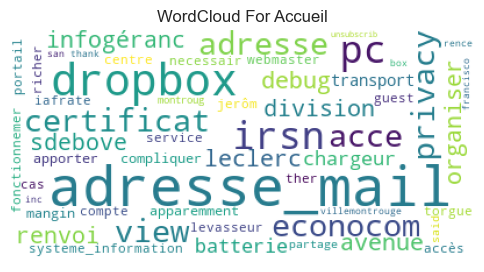

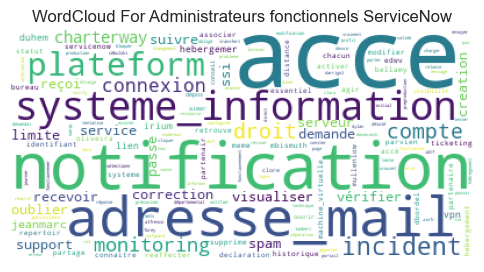

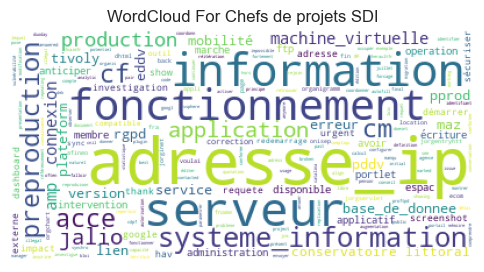

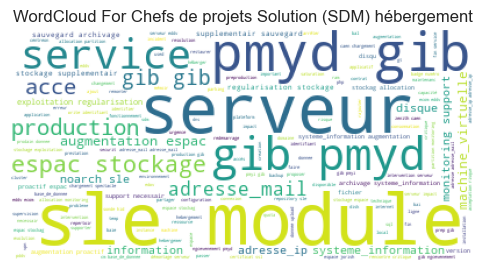

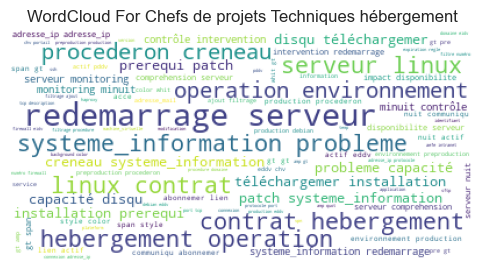

...

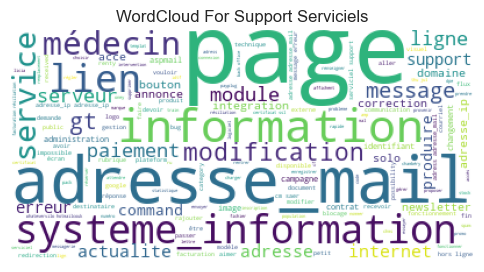

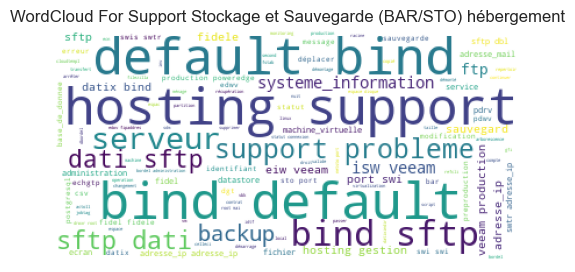

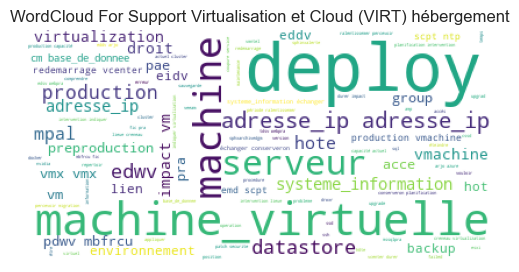

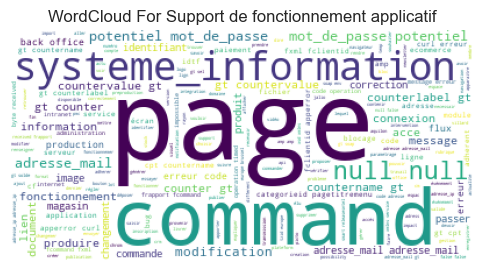

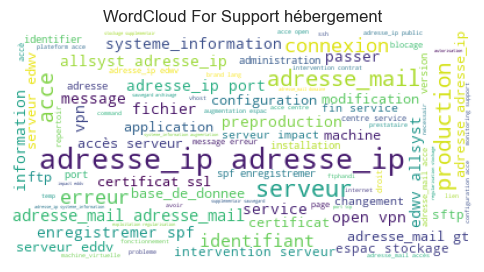

In [31]:
# wordcloud for each assignment_group

for assignment_group, target in mapping.items():
    plot_wordcloud(data_prepared, assignment_group, target)

In [32]:
# On remarque que certains mots sont bien représentées dans les wodCloud de plusieurs assignment_group
# en l'occurence : adresse , adresse_mail , adresse_ip , acces , service , serveur , information , systeme_information , probleme,
#                  page , erreur , production , preproduction , fichier , commande etc..

# ==> Potentiellement il faudait considerér ces mots comme des stopwords

In [33]:
labels = data_prepared['assignment_group']
assignement_group = list(labels.unique())

In [34]:
first_msg_by_assignment_group = pd.DataFrame(data_prepared.groupby(['assignment_group'])['lem_text']\
                                                          .apply(lambda x : ' '.join(x)))\
                               .reset_index()

#df_ = data_prepared[data_prepared.assignment_group == assignement_group[5]]
#print('Assignment group :' , assignement_group[5])

df_ = data_prepared
print("Nombre d'enregistrement :" , df_.shape[0])
df_.head(2)

Nombre d'enregistrement : 9391


,index,number,priority,assignment_group,product,nb_echanges,first_msg_ortho_stopW_synonyme,lem_tokens,lem_text,target
0,0,CS0012206,4 - Low,Support hébergement,Hébergement Divers,24,certificat ssl expire courant service renouvel...,"[certificat, ssl, expir, courant, service, ren...",certificat ssl expir courant service renouvell...,37
1,1,CS0012216,2 - High,Support N2 Capdemat,Support de fonctionnement,4,compte associés brulé tenté connexion succès d...,"[compte, associer, bruler, tenter, connexion, ...",compte associer bruler tenter connexion succè ...,25


#### __Co-occurrence des mots__ avec regles d'association

##### L'objectif ici est de se servir des règles d'association pour identfier les plus fortes association entre mots dans un même assignment_group

In [35]:
# On initialise la vectorisation avec la méthode TfIdf on prend les tokens et les bi-grammes

vec0 = TfidfVectorizer(binary = True, 
                       use_idf=False, 
                       norm = None , 
                       ngram_range = (1,2))
                      
vec0.fit(df_.lem_text)

TfidfVectorizer(binary=True, ngram_range=(1, 2), norm=None, use_idf=False)

In [36]:
# Vectorisation de notre description de ticket avec la methode TfIdf

tfidf_data0 = vec0.transform(df_.lem_text)
tfidf_data0 = pd.DataFrame(tfidf_data0.todense(), columns=vec0.get_feature_names())
print(tfidf_data0.shape)
tfidf_data0.head(3)

(9391, 120978)


,aaaf,aaaf rwkn,aabbbaabbdab,aabbbaabbdab adobe,aace,aace cfb,aadlimmofr,aadlimmofr runtoolpage,aadst,aadst account,aadst application,aae,aae whatevervilo,aauthorization,aauthorization basic,ab,ab cafe,ab ffdfb,ab with,abandonn,abandonn contact,abandonn issue,abandonn page,abandonner,abandonner adresse_mail,abandonner aimer,abandonner certificat,abandonner domaine,abandonner grâce,abandonner navigateur,abandonner profit,abandonner régulièrement,abandonner vel,abandonner échéance,abbay,abbay charlieu,abbeville,abbeville algorithm,abbinant,abbinant travaillé,abbr,abbr titl,abcd,abcd lien,abcd procedur,abcd renseigner,abcd sembla,abdbeb,abdbeb typ,abdelhafidh,abdelhafidh adresse_mail,abdelkader,abdessamad,abdessamad znagui,abefad,abefad adresse_ip,abi,abi cli,abjuridique,abjuridique gib,abl,abl acce,abl add,abl because,abl giv,able,able acce,abm,abm different,abm mdp,abo,abo ign,abo mensuelle,abonnement,abonnement résilier,abonnemer,abonnemer actualite,abonnemer an,abonnemer avoir,abonnemer bascule,abonnemer cm,abonnemer cmseolas,abonnemer compris,abonnemer difference,abonnemer domaine,abonnemer dpt,abonnemer dsv,abonnemer définitif,abonnemer démarch,abonnemer eau,abonnemer factur,abonnemer fonctionner,abonnemer forum,abonnemer identifier,abonnemer lecteur,abonnemer licier,abonnemer lien,abonnemer liste,abonnemer mensuel,abonnemer newsletter,abonnemer participer,abonnemer prendre,abonnemer recevoir,abonnemer recontacter,abonnemer renseignement,abonnemer résilier,abonnemer serviciel,abonnemer simultanement,abord,abord assurer,abord authentifier,abord commencer,abord erreur,abord image,abord invite,abord joindre,abord meilleur,abord preproduction,abord produit,abord systeme_information,abord tien,abord valider,abord vouloir,abord élément,aborder,aborder certificat,aborder conservon,aborder nombreux,aborted,aborted could,aborting,aborting fichier,abourouh,abourouh adnan,abourouh adresse_mail,about,about connect,about deleting,about dmarc,about environmer,about information,about permission,abouti,abouti bloquer,abouti lod,aboutier,aboutier gt,aboutir,aboutir adresse_mail,aboutir code,aboutir erreur,aboutir forcément,aboutir mamma,aboutir office,aboutir page,aboutir spam,aboutir systeme_information,aboutir tablette,aboutir tim,aboutir trois,aboutir vouloir,aboutit,aboutit cube,aboutit essayer,aboutit jamais,above,above are,above poc,above reference,aboweb,aboweb edwv,aboweb toucher,abr,abr adresse_ip,abr cad,abr cooperativ,abr domaine,abr information,abr mijanvier,abr parvenir,abr prendre,abr probleme,abr recalculer,abr remontée,abr remplacer,abr ssl,abr transfèr,abr trois,abraham,abraham adresse_mail,abraham incident,abrasif,abrasif name,abrasif partner,abrasivescom,abrasivescom eshop,abrasivesxx,abrasivesxx phenicsxxx,abrconf,abrconf insérer,abrcoop,abrcoop desbiolle,abrcoop tam,abriter,abriter vhost,abrtco,abrtco service,absense,absense eulalie,absent,absent achat,absent adresse_mail,absent ajouter,absent arrêt,absent ecommerce,absent gt,absent landing,absent loin,absent racine,absent serveur,absent villar,absie,absie adresse,absolu,absolu fichier,absolu program,absolu réserve,absolument,absolument acce,absolument couper,absolument ddo,absolument décision,absolument effacer,absolument endroit,absolument fonctionner,absolument mise_a_jour,absolument nmessag,absolument professionnel,absolument soyon,absolut,absolut left,absolut list,absolut systeme_information,absolut top,absorption,absorption vente,abspowertxt,abspowertxt retrouve,abstraction,abstraction noarch,...,évoluer serveur,évoluer upgrade,évoluer version,évolutif,évolutif ligne,évolutive,évolutive correctif,évolué,évolué agir,évolué contrat,évolué correction,évolué modalité,évolué souhaiter,évolué tag,évoquer,évoquer adresse_ip,évoquer adresse_mail,évoquer annoncer,évoquer changement,évoquer compil,évoquer cotech,évoquer drode,évoquer evolution,évoquer export,évoquer instant,évoquer message,évoquer pist,évoquer précédemment,évoquer rdv,évoquer revoir,évoquer sandy,évoquer vp

In [37]:
# Reconstitution du dataset avec les assignment_group pour pouvoir filtrer et faire le focus sur un assignment_group particulier

tfidf_data0_t = pd.concat([tfidf_data0 , labels] , axis = 1)
tfidf_data0_t.head()

,aaaf,aaaf rwkn,aabbbaabbdab,aabbbaabbdab adobe,aace,aace cfb,aadlimmofr,aadlimmofr runtoolpage,aadst,aadst account,aadst application,aae,aae whatevervilo,aauthorization,aauthorization basic,ab,ab cafe,ab ffdfb,ab with,abandonn,abandonn contact,abandonn issue,abandonn page,abandonner,abandonner adresse_mail,abandonner aimer,abandonner certificat,abandonner domaine,abandonner grâce,abandonner navigateur,abandonner profit,abandonner régulièrement,abandonner vel,abandonner échéance,abbay,abbay charlieu,abbeville,abbeville algorithm,abbinant,abbinant travaillé,abbr,abbr titl,abcd,abcd lien,abcd procedur,abcd renseigner,abcd sembla,abdbeb,abdbeb typ,abdelhafidh,abdelhafidh adresse_mail,abdelkader,abdessamad,abdessamad znagui,abefad,abefad adresse_ip,abi,abi cli,abjuridique,abjuridique gib,abl,abl acce,abl add,abl because,abl giv,able,able acce,abm,abm different,abm mdp,abo,abo ign,abo mensuelle,abonnement,abonnement résilier,abonnemer,abonnemer actualite,abonnemer an,abonnemer avoir,abonnemer bascule,abonnemer cm,abonnemer cmseolas,abonnemer compris,abonnemer difference,abonnemer domaine,abonnemer dpt,abonnemer dsv,abonnemer définitif,abonnemer démarch,abonnemer eau,abonnemer factur,abonnemer fonctionner,abonnemer forum,abonnemer identifier,abonnemer lecteur,abonnemer licier,abonnemer lien,abonnemer liste,abonnemer mensuel,abonnemer newsletter,abonnemer participer,abonnemer prendre,abonnemer recevoir,abonnemer recontacter,abonnemer renseignement,abonnemer résilier,abonnemer serviciel,abonnemer simultanement,abord,abord assurer,abord authentifier,abord commencer,abord erreur,abord image,abord invite,abord joindre,abord meilleur,abord preproduction,abord produit,abord systeme_information,abord tien,abord valider,abord vouloir,abord élément,aborder,aborder certificat,aborder conservon,aborder nombreux,aborted,aborted could,aborting,aborting fichier,abourouh,abourouh adnan,abourouh adresse_mail,about,about connect,about deleting,about dmarc,about environmer,about information,about permission,abouti,abouti bloquer,abouti lod,aboutier,aboutier gt,aboutir,aboutir adresse_mail,aboutir code,aboutir erreur,aboutir forcément,aboutir mamma,aboutir office,aboutir page,aboutir spam,aboutir systeme_information,aboutir tablette,aboutir tim,aboutir trois,aboutir vouloir,aboutit,aboutit cube,aboutit essayer,aboutit jamais,above,above are,above poc,above reference,aboweb,aboweb edwv,aboweb toucher,abr,abr adresse_ip,abr cad,abr cooperativ,abr domaine,abr information,abr mijanvier,abr parvenir,abr prendre,abr probleme,abr recalculer,abr remontée,abr remplacer,abr ssl,abr transfèr,abr trois,abraham,abraham adresse_mail,abraham incident,abrasif,abrasif name,abrasif partner,abrasivescom,abrasivescom eshop,abrasivesxx,abrasivesxx phenicsxxx,abrconf,abrconf insérer,abrcoop,abrcoop desbiolle,abrcoop tam,abriter,abriter vhost,abrtco,abrtco service,absense,absense eulalie,absent,absent achat,absent adresse_mail,absent ajouter,absent arrêt,absent ecommerce,absent gt,absent landing,absent loin,absent racine,absent serveur,absent villar,absie,absie adresse,absolu,absolu fichier,absolu program,absolu réserve,absolument,absolument acce,absolument couper,absolument ddo,absolument décision,absolument effacer,absolument endroit,absolument fonctionner,absolument mise_a_jour,absolument nmessag,absolument professionnel,absolument soyon,absolut,absolut left,absolut list,absolut systeme_information,absolut top,absorption,absorption vente,abspowertxt,abspowertxt retrouve,abstraction,abstraction noarch,...,évoluer upgrade,évoluer version,évolutif,évolutif ligne,évolutive,évolutive correctif,évolué,évolué agir,évolué contrat,évolué correction,évolué modalité,évolué souhaiter,évolué tag,évoquer,évoquer adresse_ip,évoquer adresse_mail,évoquer annoncer,évoquer changement,évoquer compil,évoquer cotech,évoquer drode,évoquer evolution,évoquer export,évoquer instant,évoquer message,évoquer pist,évoquer précédemment,évoquer rdv,évoquer revoir,évoquer sandy,évoquer vpn,évènement,évèn

In [38]:
# Identification des item sets les plus fréquents et leur support

frq_items = apriori(tfidf_data0.head(50) , min_support = 0.05, use_colnames = True)
frq_items

,support,itemsets
0,0.16,(acce)
1,0.10,(accès)
2,0.14,(adresse)
3,0.26,(adresse_ip)
4,0.14,(adresse_ip adresse_ip)
...,...,...
79,0.06,"(serveur, adresse_ip, accès)"
80,0.06,"(adresse_ip adresse_ip, adresse_ip, fichier)"
81,0.06,"(serveur, adresse_ip, adresse_ip serveur)"
82,0.06,"(adresse_ip, port, protocole)"


In [39]:
# Regles degagés du dataset global avec la contrainte d'une confiance de 0,60 minimum

# ==> On remarque une forte assocition entre les mots serveur et production
# ==>                                  entre les mots protocole, port et adresse_ip
# ==>                                  entre les mots acces serveur adresse_ip

rules = association_rules(frq_items, metric = "confidence", min_threshold = 0.6)
rules.sort_values(by = ['confidence'] , ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
38,(serveur production),"(serveur, production)",0.06,0.08,0.06,1.000,12.500000,0.0552,inf
14,(protocole),(port),0.06,0.06,0.06,1.000,16.666667,0.0564,inf
29,(adresse_ip serveur),"(serveur, adresse_ip)",0.06,0.10,0.06,1.000,10.000000,0.0540,inf
28,"(adresse_ip, adresse_ip serveur)",(serveur),0.06,0.26,0.06,1.000,3.846154,0.0444,inf
27,"(serveur, adresse_ip serveur)",(adresse_ip),0.06,0.26,0.06,1.000,3.846154,0.0444,inf
32,"(port, protocole)",(adresse_ip),0.06,0.26,0.06,1.000,3.846154,0.0444,inf
25,"(adresse_ip, fichier)",(adresse_ip adresse_ip),0.06,0.14,0.06,1.000,7.142857,0.0516,inf
24,"(adresse_ip adresse_ip, fichier)",(adresse_ip),0.06,0.26,0.06,1.000,3.846154,0.0444,inf
33,(port),"(adresse_ip, protocole)",0.06,0.06,0.06,1.000,16.666667,0.0564,inf
21,"(serveur, accès)",(adresse_ip),0.06,0.26,0.06,1.000,3.846154,0.0444,inf


In [40]:
# Regles par assignment_group

#### word vectorization

In [41]:
# Vectorisation du descriptif du ticket
# On travaille avec les one-gram et les bi-gram
# Jouer avec min_df et use_idf

vec = TfidfVectorizer(min_df = min(10,df_.shape[0]), 
                      binary = True, 
                      use_idf=True, 
                      norm = None , 
                      ngram_range = (1,2))
                      
vec.fit(df_.lem_text)

TfidfVectorizer(binary=True, min_df=10, ngram_range=(1, 2), norm=None)

In [42]:
# Vectorisation 

tfidf_data = vec.transform(df_.lem_text)
tfidf_data = pd.DataFrame(tfidf_data.todense(), columns=vec.get_feature_names())
print(tfidf_data.shape)
tfidf_data.head()

(9391, 3255)


,abandonner,abonnemer,abonnemer domaine,abonnemer lien,abord,aboutir,abr,absent,absolument,acce,acce acce,acce adresse,acce adresse_ip,acce adresse_mail,acce centre,acce centreon,acce conduent,acce denied,acce environnement,acce fonctionnement,acce fonctionnemer,acce ftp,acce identifier,acce information,acce interfac,acce internet,acce open,acce page,acce phpmyadmin,acce plateform,acce preproduction,acce production,acce rdp,acce renovation,acce ressource,acce saphir,acce serveur,acce service,acce sftp,acce societe,acce ssh,acce vpn,acceptation,acceptation party,acceptation risque,accompagnement,accompagner,accorder,account,accè,accèder,accès,accès environnement,accès ftp,accès preproduction,accès serveur,accéder,acem,achat,achatvill,acl,acquérir,acte,actif,actif eddv,actif pddv,activation,activer,activité,actu,actualiser,actualite,actuel,adapter,add,address,adherent,adherer,administration,administration serveur,adobe,adress,adress adresse_ip,adress adresse_mail,adresse,adresse adresse_ip,adresse adresse_mail,adresse_ip,adresse_ip acce,adresse_ip accès,adresse_ip adresse_ip,adresse_ip adresse_mail,adresse_ip autorisation,adresse_ip autoriser,adresse_ip changemer,adresse_ip connexion,adresse_ip domaine,adresse_ip eddv,adresse_ip edwv,adresse_ip effectif,adresse_ip enregistremer,adresse_ip erreur,adresse_ip fixe,adresse_ip gt,adresse_ip hostname,adresse_ip identifiant,adresse_ip information,adresse_ip machine_virtuelle,adresse_ip pddv,adresse_ip phpmyadmin,adresse_ip port,adresse_ip preproduction,adresse_ip prestataire,adresse_ip principal,adresse_ip priv,adresse_ip production,adresse_ip protocole,adresse_ip pub,adresse_ip public,adresse_ip remplacement,adresse_ip serveur,adresse_ip service,adresse_ip systeme_information,adresse_ip vpn,adresse_mail,adresse_mail acce,adresse_mail accès,adresse_mail administration,adresse_mail adresse,adresse_mail adresse_ip,adresse_mail adresse_mail,adresse_mail arriver,adresse_mail associer,adresse_mail certificat,adresse_mail changemer,adresse_mail command,adresse_mail dns,adresse_mail domaine,adresse_mail ecommerce,adresse_mail envoyer,adresse_mail erreur,adresse_mail gt,adresse_mail information,adresse_mail message,adresse_mail passer,adresse_mail serveur,adresse_mail spam,adresse_mail systeme_information,adresser,adulte,aefe,affecter,affecté,affichent,afficher,after,again,agence,agir,agréable,aider,aimer,aimerai,ain,air,ajout,ajout adresse_ip,ajout disque,ajout filtrage,ajout nomvlan,ajouter,ajuster,alerter,alfresco,algorithm,algorithm encodage,algorithme,algorithme encodage,alias,alimentation,alimenter,aller,aller page,allocation,allocation monitoring,allocation partition,allow,allsyst,allsyst adresse_ip,alt,alternatif,aléatoire,amelioration,amont,amont pouvoir,amp,amp amp,améliorer,anahfr,ancien,andré,andré woisard,anglais,annonce,annoncer,annuel,annulation,annuler,annulion,annulion explicite,année,anomalie,anomaly,anomaly réagission,anormal,ansibl,antispam,antiviru,antiviru sonde,antivirus,antivirus viser,any,any adresse_ip,aout,août,apache,apache availabl,apache vitrine,apercevoir,api,apidae,apm,apparaitre,apparaître,apparemment,appartemer,appartemer manuellemer,appartenir,appel,appeler,appli,applicable,applicatif,applicatif charge,applicatif entrainer,applicatif système,application,application firewall,application mobile,application production,...,ton,top,totalement,toucher,toupargel,tourn,tourner,toutefois,toutefois constater,toutefois fassion,trac,trac derogation,trafic,train,traite,traitement,traiter,tranch,transaction,transferer,transferer gestion,transfert,transfert domaine,transférer,transféron,transféron exister,transmet,transmission,transmission lancion,transmission monitoring,transport,travail,travailler,travaillon,traval,travers,tri,trois,trouver,true,try,tse,ttl,tue,tue bandotheque,tue cartouch,typo,typo php,tâche,téléchargement,téléchargemer,téléchargemer installation,télécharger,téléphonique,téléservic,télétravail,tôt,udp,ulterieurement,ulterieurement hebergement,unabl,unava

In [43]:
# Affichage de l'importances des mots basés sur le poids Tfidf

plotnine.options.figure_size = (16, 8)

def gg_word_importance(df, x , x_lab = "Words", y_lab = "Document Frequency", title = "Distribution of tfidf weights", binwidth = 70):
    gg = (ggplot(df.iloc[0:35,:], aes('x_axis', 'count')) +
          geom_line(color = "orange", size = 1.3) +
          geom_point(size = 0.5) +
          geom_text(aes(label = x, angle = 25), ha = 'left', va = 'bottom', size = 7, position = position_stack(vjust = 1.03)) +
          theme_minimal() +
          labs(x = x_lab, y = y_lab, title = title) +
          theme(axis_text_x = element_blank())
         )
    return gg

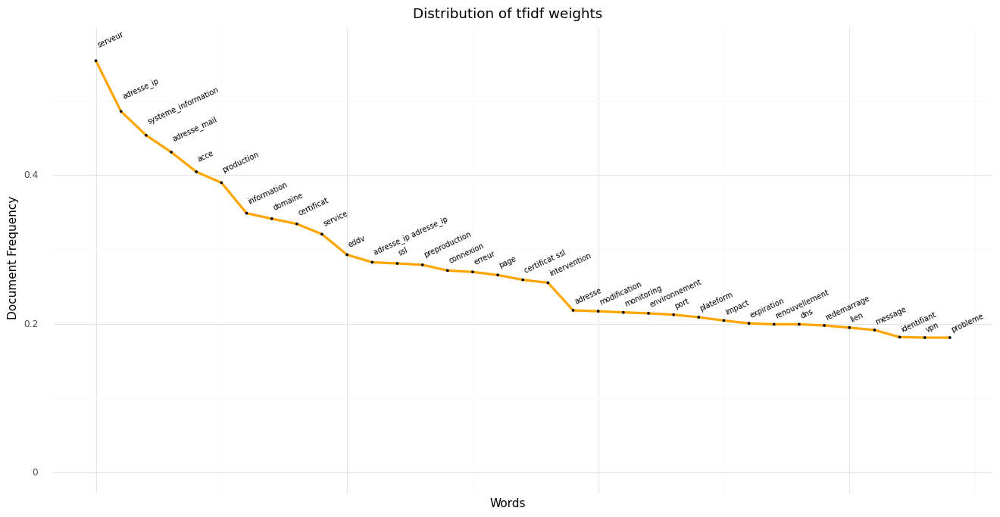

<ggplot: (78941380615)>

In [44]:
# Les mots les plus importants dans tout le corpus vocabulaire

df = pd.DataFrame(tfidf_data.sample(tfidf_data.shape[0]).mean(0).sort_values(ascending = False)).reset_index()
df.columns = ['word', 'count']
df['x_axis'] = np.arange(0, len(df))

gg_word_importance(df, 
                   x = 'word')

In [45]:
# Donnees totales pour pouvoir filtrer par assignment_group

donnees_totales = pd.concat([tfidf_data.reset_index(drop = True) , 
                             pd.DataFrame(labels).reset_index(drop = True)] , axis = 1)

donnees_totales.head()

,abandonner,abonnemer,abonnemer domaine,abonnemer lien,abord,aboutir,abr,absent,absolument,acce,acce acce,acce adresse,acce adresse_ip,acce adresse_mail,acce centre,acce centreon,acce conduent,acce denied,acce environnement,acce fonctionnement,acce fonctionnemer,acce ftp,acce identifier,acce information,acce interfac,acce internet,acce open,acce page,acce phpmyadmin,acce plateform,acce preproduction,acce production,acce rdp,acce renovation,acce ressource,acce saphir,acce serveur,acce service,acce sftp,acce societe,acce ssh,acce vpn,acceptation,acceptation party,acceptation risque,accompagnement,accompagner,accorder,account,accè,accèder,accès,accès environnement,accès ftp,accès preproduction,accès serveur,accéder,acem,achat,achatvill,acl,acquérir,acte,actif,actif eddv,actif pddv,activation,activer,activité,actu,actualiser,actualite,actuel,adapter,add,address,adherent,adherer,administration,administration serveur,adobe,adress,adress adresse_ip,adress adresse_mail,adresse,adresse adresse_ip,adresse adresse_mail,adresse_ip,adresse_ip acce,adresse_ip accès,adresse_ip adresse_ip,adresse_ip adresse_mail,adresse_ip autorisation,adresse_ip autoriser,adresse_ip changemer,adresse_ip connexion,adresse_ip domaine,adresse_ip eddv,adresse_ip edwv,adresse_ip effectif,adresse_ip enregistremer,adresse_ip erreur,adresse_ip fixe,adresse_ip gt,adresse_ip hostname,adresse_ip identifiant,adresse_ip information,adresse_ip machine_virtuelle,adresse_ip pddv,adresse_ip phpmyadmin,adresse_ip port,adresse_ip preproduction,adresse_ip prestataire,adresse_ip principal,adresse_ip priv,adresse_ip production,adresse_ip protocole,adresse_ip pub,adresse_ip public,adresse_ip remplacement,adresse_ip serveur,adresse_ip service,adresse_ip systeme_information,adresse_ip vpn,adresse_mail,adresse_mail acce,adresse_mail accès,adresse_mail administration,adresse_mail adresse,adresse_mail adresse_ip,adresse_mail adresse_mail,adresse_mail arriver,adresse_mail associer,adresse_mail certificat,adresse_mail changemer,adresse_mail command,adresse_mail dns,adresse_mail domaine,adresse_mail ecommerce,adresse_mail envoyer,adresse_mail erreur,adresse_mail gt,adresse_mail information,adresse_mail message,adresse_mail passer,adresse_mail serveur,adresse_mail spam,adresse_mail systeme_information,adresser,adulte,aefe,affecter,affecté,affichent,afficher,after,again,agence,agir,agréable,aider,aimer,aimerai,ain,air,ajout,ajout adresse_ip,ajout disque,ajout filtrage,ajout nomvlan,ajouter,ajuster,alerter,alfresco,algorithm,algorithm encodage,algorithme,algorithme encodage,alias,alimentation,alimenter,aller,aller page,allocation,allocation monitoring,allocation partition,allow,allsyst,allsyst adresse_ip,alt,alternatif,aléatoire,amelioration,amont,amont pouvoir,amp,amp amp,améliorer,anahfr,ancien,andré,andré woisard,anglais,annonce,annoncer,annuel,annulation,annuler,annulion,annulion explicite,année,anomalie,anomaly,anomaly réagission,anormal,ansibl,antispam,antiviru,antiviru sonde,antivirus,antivirus viser,any,any adresse_ip,aout,août,apache,apache availabl,apache vitrine,apercevoir,api,apidae,apm,apparaitre,apparaître,apparemment,appartemer,appartemer manuellemer,appartenir,appel,appeler,appli,applicable,applicatif,applicatif charge,applicatif entrainer,applicatif système,application,application firewall,application mobile,application production,...,top,totalement,toucher,toupargel,tourn,tourner,toutefois,toutefois constater,toutefois fassion,trac,trac derogation,trafic,train,traite,traitement,traiter,tranch,transaction,transferer,transferer gestion,transfert,transfert domaine,transférer,transféron,transféron exister,transmet,transmission,transmission lancion,transmission monitoring,transport,travail,travailler,travaillon,traval,travers,tri,trois,trouver,true,try,tse,ttl,tue,tue bandotheque,tue cartouch,typo,typo php,tâche,téléchargement,téléchargemer,téléchargemer installation,télécharger,téléphonique,téléservic,télétravail,tôt,udp,ulterieurement,ulterieurement hebergement,unabl,unavailab

In [46]:
donnees_totales.isna().sum()

abandonner           0
abonnemer            0
abonnemer domaine    0
abonnemer lien       0
abord                0
                    ..
événement            0
être                 0
être necessaire      0
être titulaire       0
assignment_group     0
Length: 3256, dtype: int64

0 Support hébergement


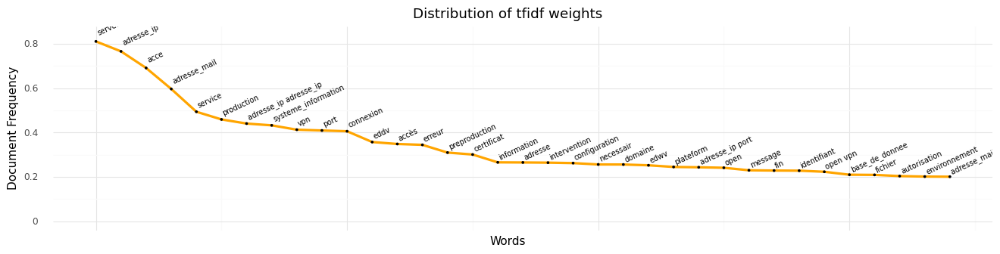


1 Support N2 Capdemat 


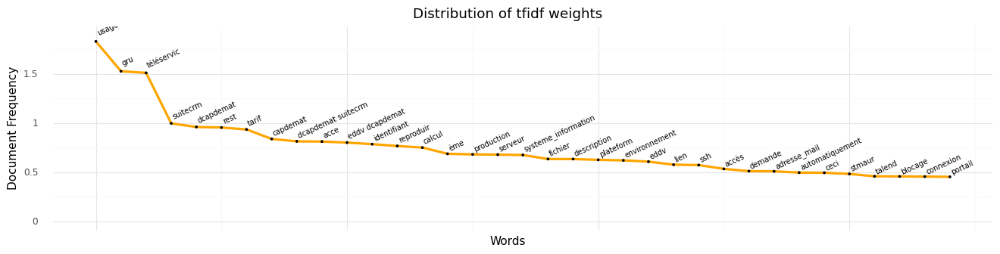


2 Support de fonctionnement applicatif


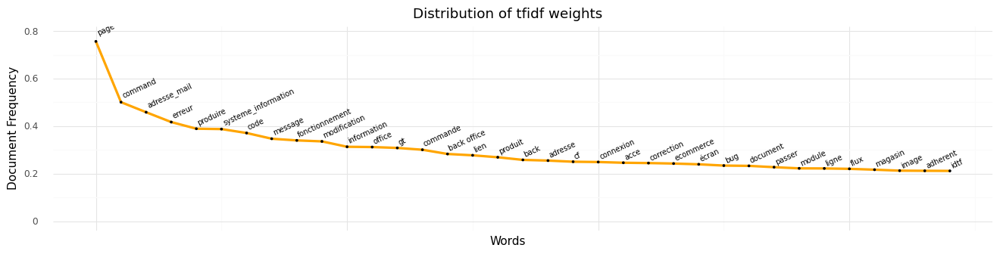


3 Equipe Webmarketing


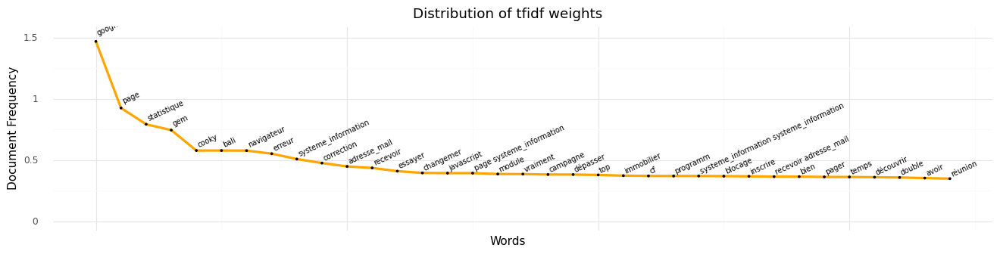


4 Support N2 CMS.eolas


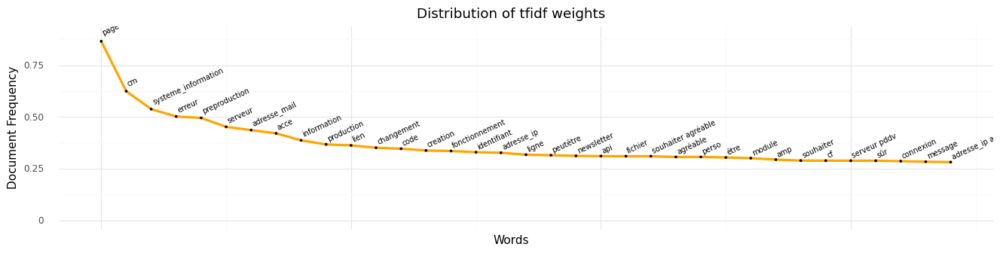


5 Support CSI (N2 LX) hébergement


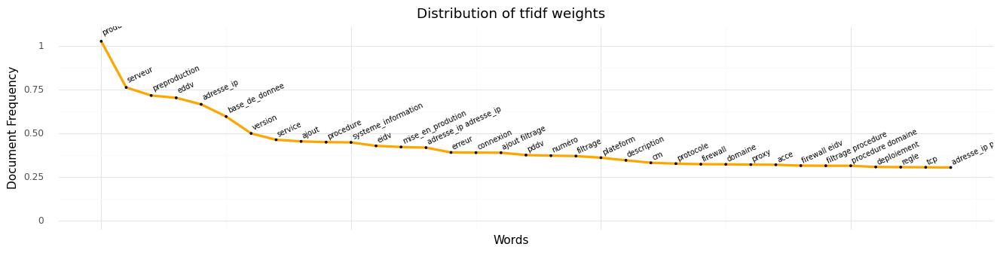


6 Support N2 Drupal


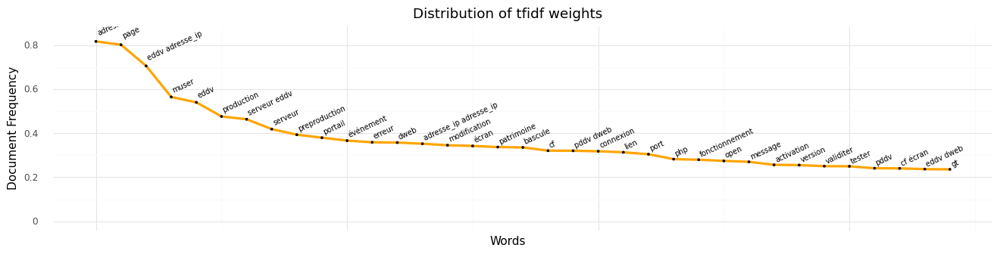


7 Support CSI (N2 MS) hébergement


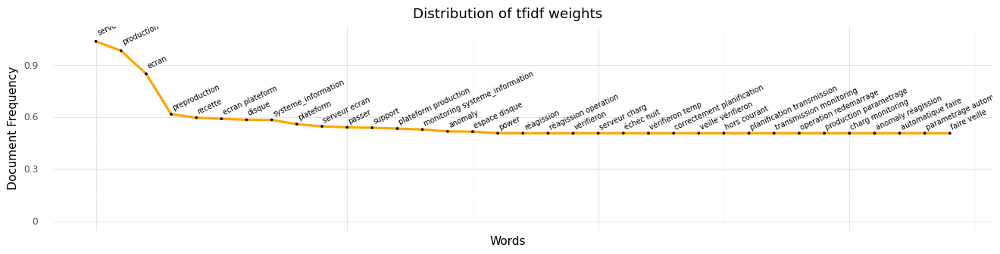


8 Support N2 Symfony / e-commerce


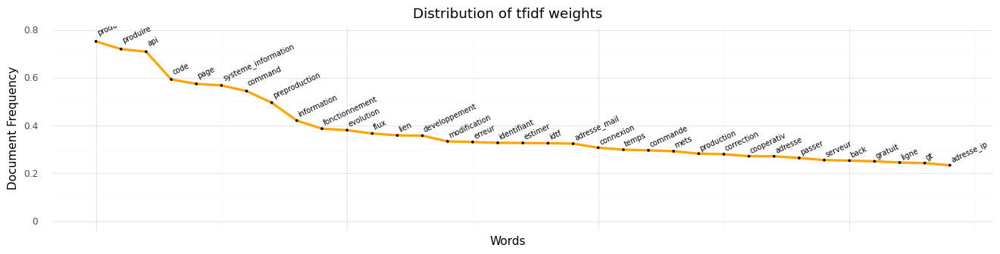


9 Chefs de projets Techniques hébergement


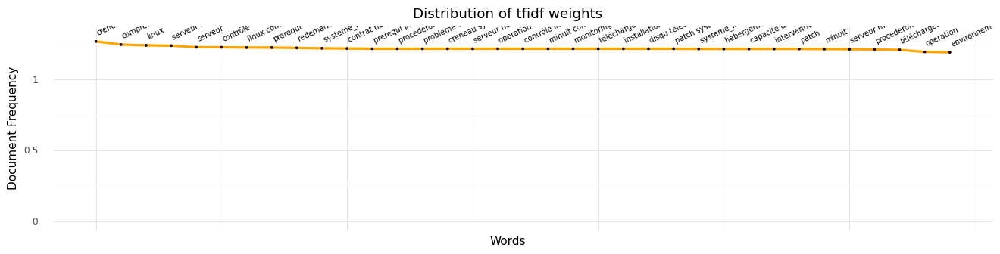


10 Support Nom de Domaine


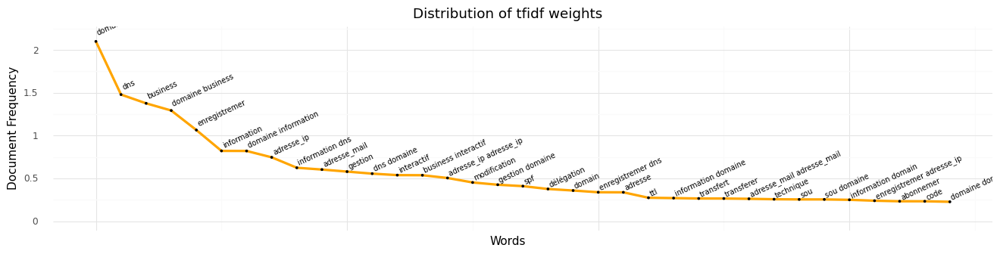


11 Chefs de projets Solution (SDM) hébergement


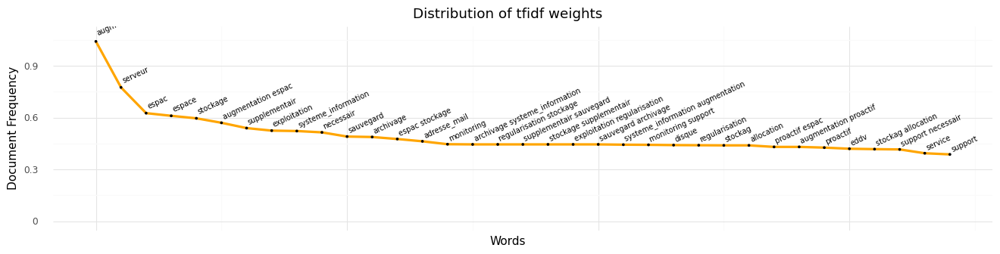


12 Chefs de projets SDI


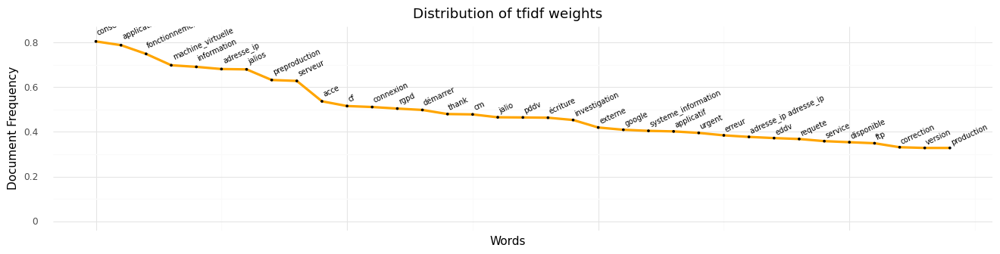


13 Support N2 Jalios


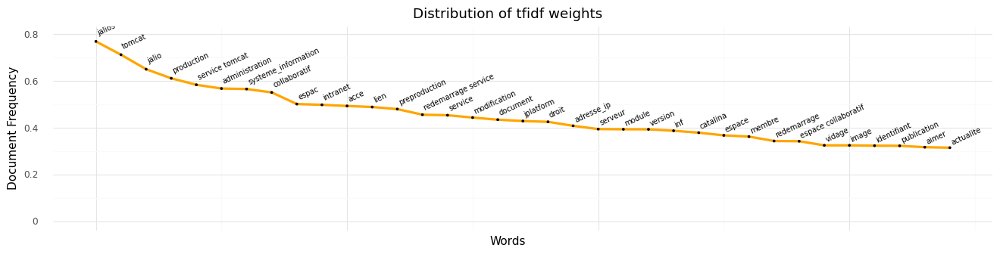


14 Support Achatville


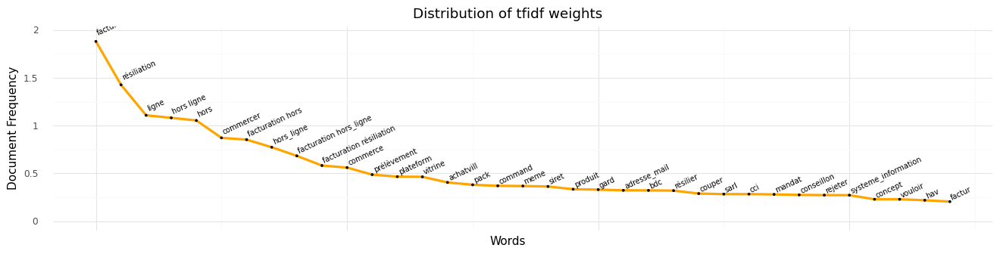


15 Support N2 Serviciels


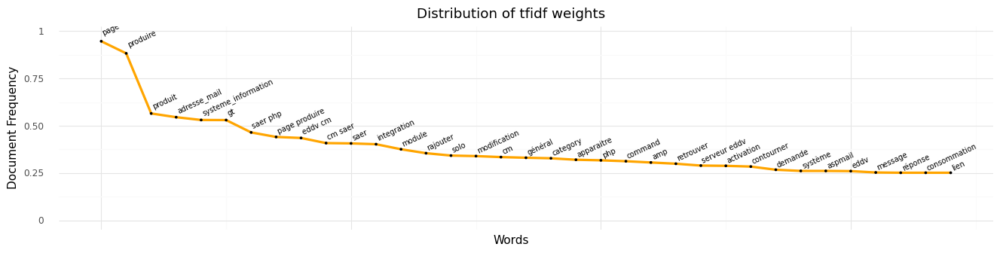


16 Support Réseau (NET) hébergement


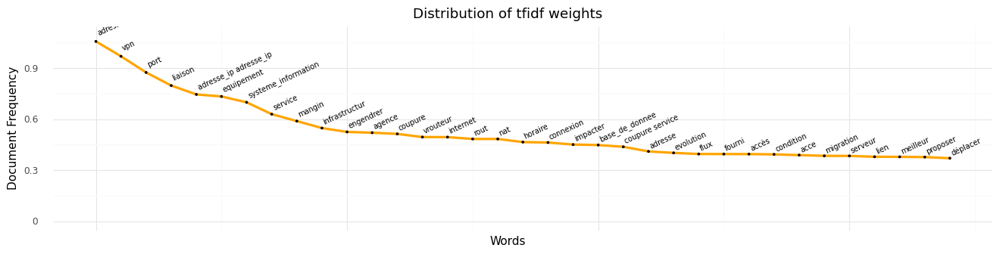


17 Accueil


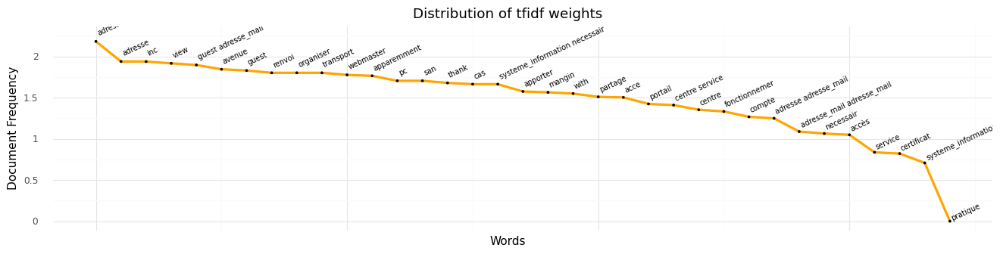


18 Support Hardware hébergement


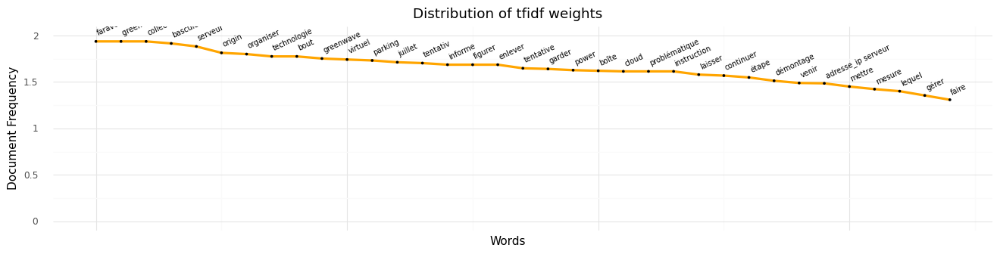


19 Support Serviciels


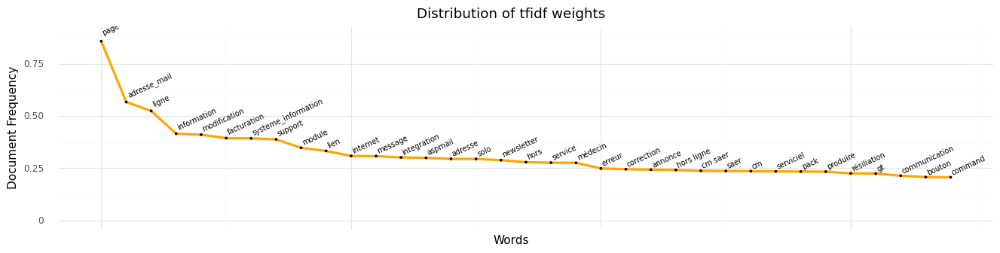


20 Support Certificats SSL


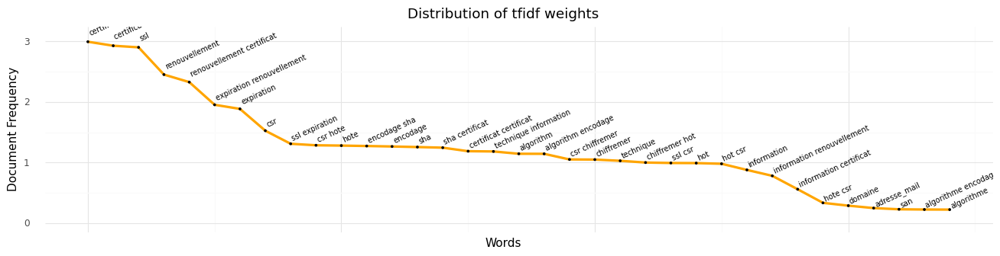


21 Support N2 WordPress


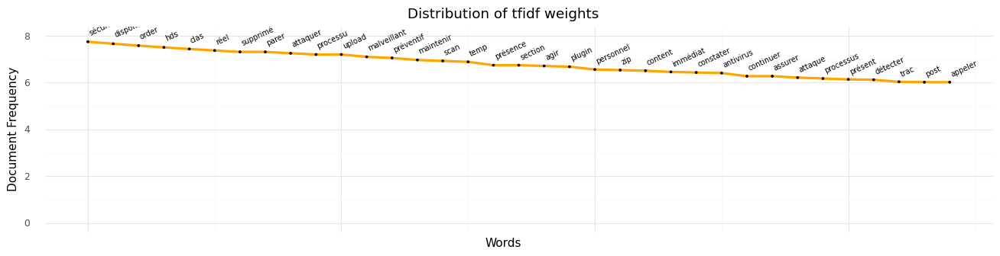


22 Support N2 Achatville


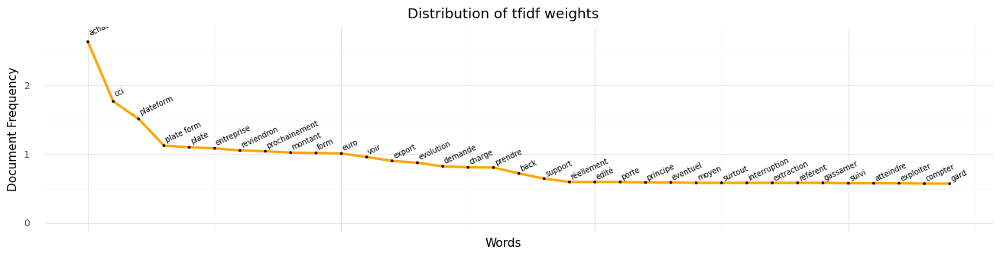


23 Support Virtualisation et Cloud (VIRT) hébergement


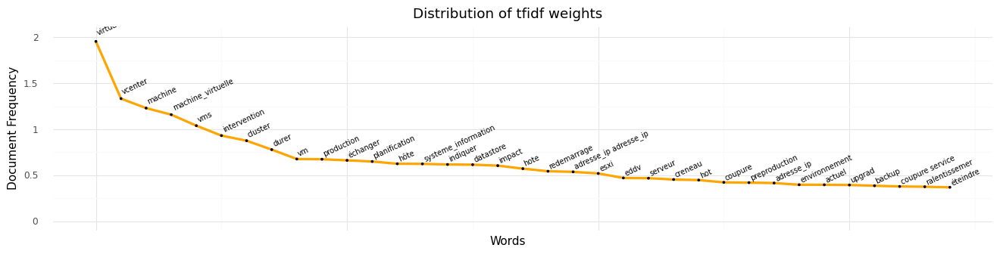


24 Support COSSI (N2 Sécurité) hébergement


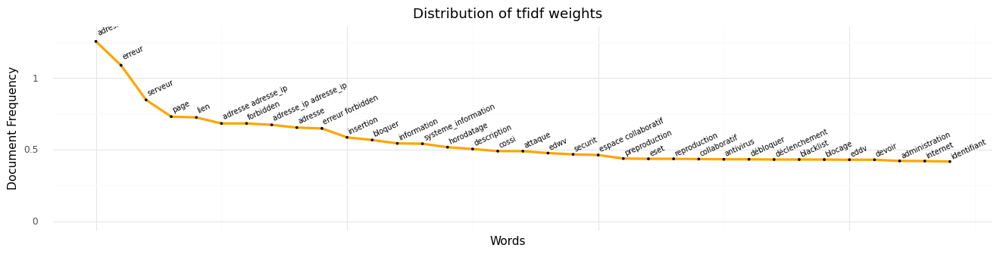


25 Support DCM hébergement


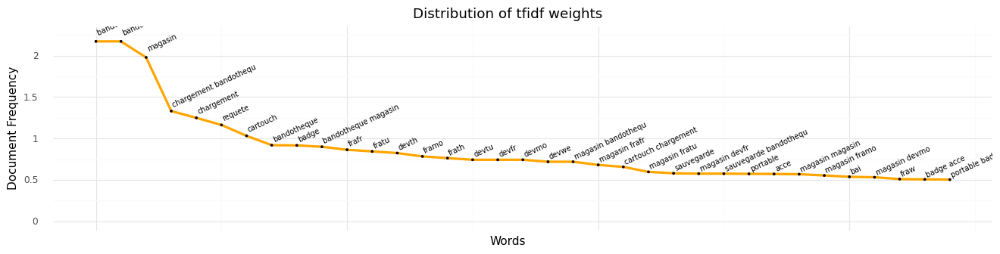


26 Facturation


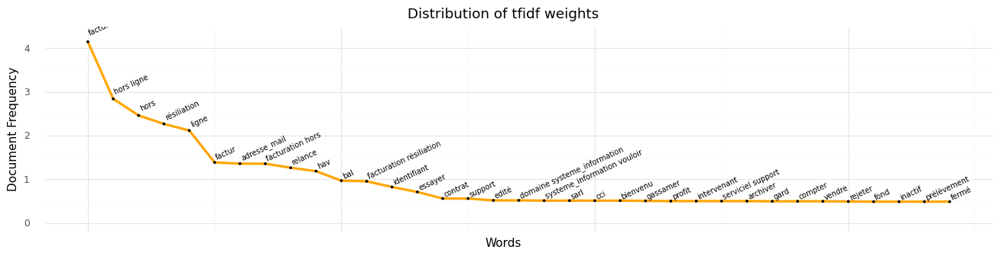


27 Equipe Build hébergement


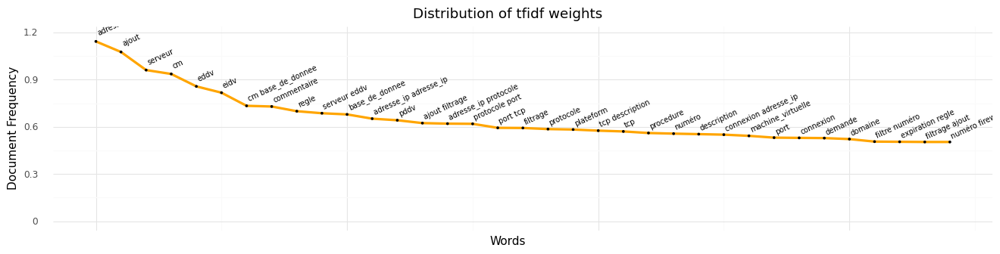


28 Support Stockage et Sauvegarde (BAR/STO) hébergement


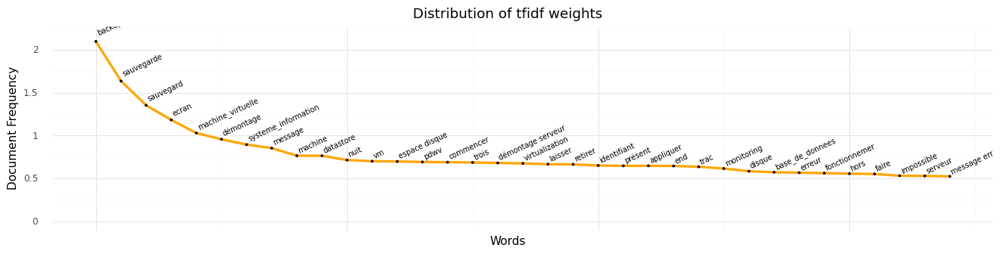


29 Support Informatique Interne


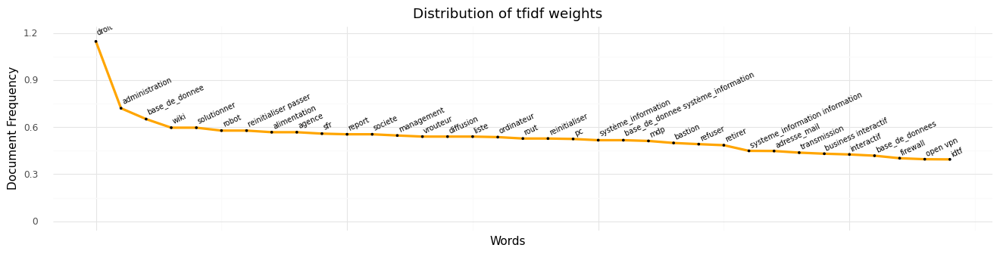


30 Support Industrialisation hébergement


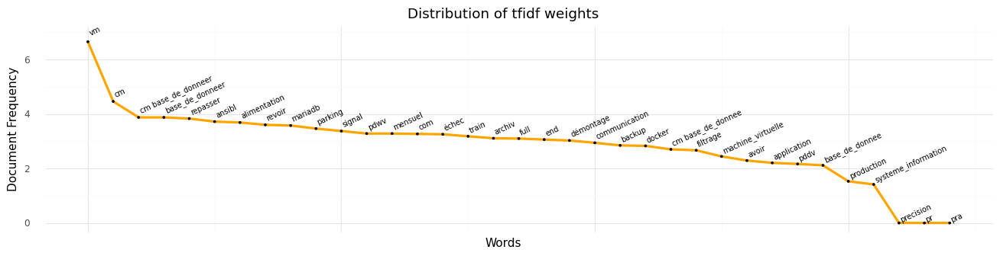


31 Support Monitoring hébergement


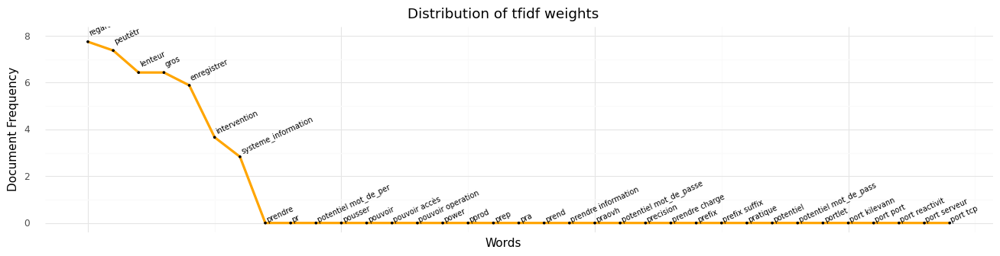


32 Administrateurs fonctionnels ServiceNow


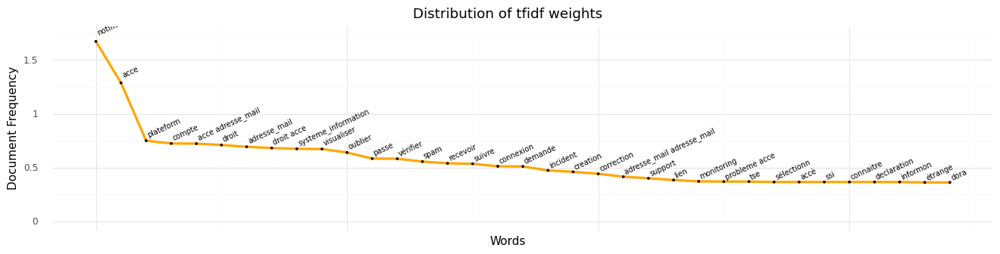


33 Support Industrialisation SDI


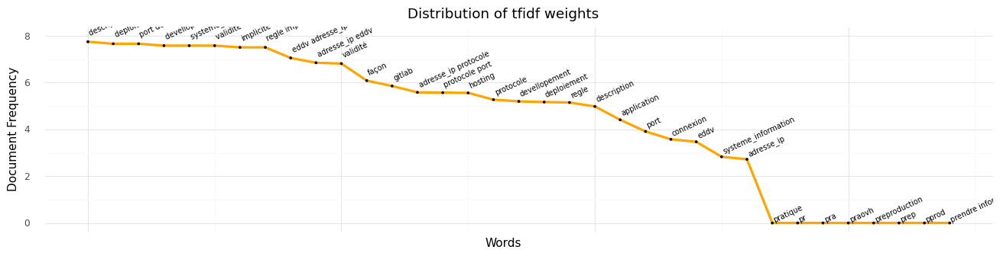


34 Pilotage Support hébergement


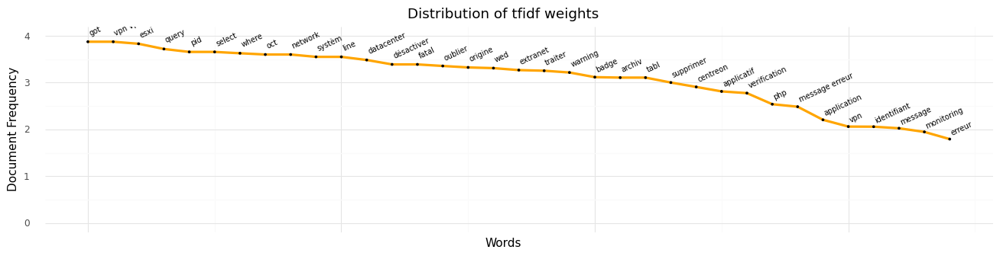


35 Support MPDML


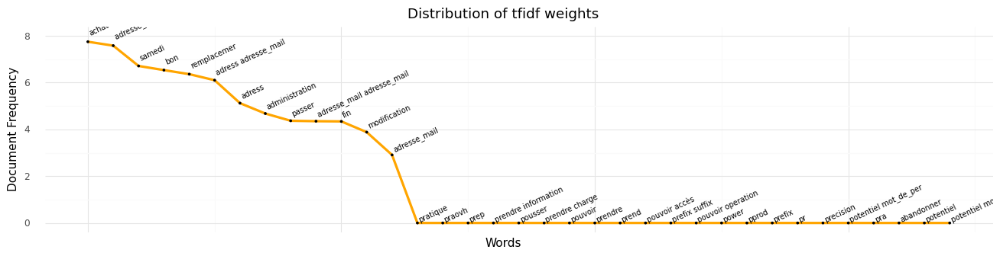


36 Responsables Comptes Clients


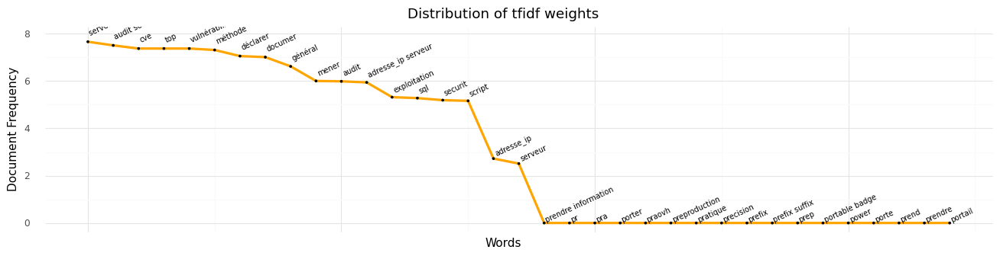


37 Support DNS hébergement


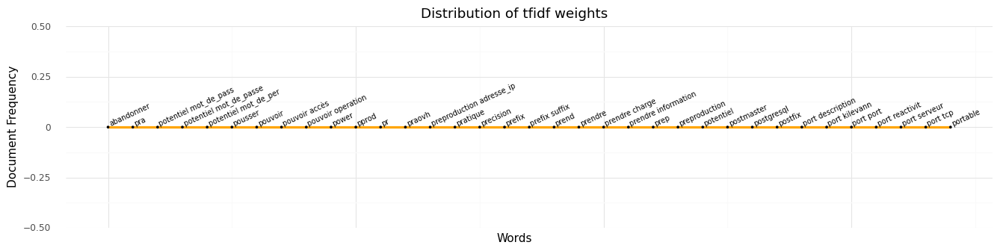

In [47]:
# Affichage des 35 mots les plus important au sens des poids tfidf

plotnine.options.figure_size = (16, 3.5) 

for i in range(len(assignement_group)):
    print(i , assignement_group[i])
    df = donnees_totales[donnees_totales.assignment_group == assignement_group[i]]
    df = pd.DataFrame(df.mean(0).sort_values(ascending = False)).reset_index()
    df.columns = ['word', 'count']
    df['x_axis'] = np.arange(0, len(df))
    print(gg_word_importance(df, 
                             x = 'word'))

In [48]:
# On remarque des intersections entreassignment_group en considérant les 35 mots les plus important affichés.

In [49]:
# Une classe anormale
# Texte dans le ticket insignifiant

donnees_totales[donnees_totales.assignment_group == assignement_group[37]]

,abandonner,abonnemer,abonnemer domaine,abonnemer lien,abord,aboutir,abr,absent,absolument,acce,acce acce,acce adresse,acce adresse_ip,acce adresse_mail,acce centre,acce centreon,acce conduent,acce denied,acce environnement,acce fonctionnement,acce fonctionnemer,acce ftp,acce identifier,acce information,acce interfac,acce internet,acce open,acce page,acce phpmyadmin,acce plateform,acce preproduction,acce production,acce rdp,acce renovation,acce ressource,acce saphir,acce serveur,acce service,acce sftp,acce societe,acce ssh,acce vpn,acceptation,acceptation party,acceptation risque,accompagnement,accompagner,accorder,account,accè,accèder,accès,accès environnement,accès ftp,accès preproduction,accès serveur,accéder,acem,achat,achatvill,acl,acquérir,acte,actif,actif eddv,actif pddv,activation,activer,activité,actu,actualiser,actualite,actuel,adapter,add,address,adherent,adherer,administration,administration serveur,adobe,adress,adress adresse_ip,adress adresse_mail,adresse,adresse adresse_ip,adresse adresse_mail,adresse_ip,adresse_ip acce,adresse_ip accès,adresse_ip adresse_ip,adresse_ip adresse_mail,adresse_ip autorisation,adresse_ip autoriser,adresse_ip changemer,adresse_ip connexion,adresse_ip domaine,adresse_ip eddv,adresse_ip edwv,adresse_ip effectif,adresse_ip enregistremer,adresse_ip erreur,adresse_ip fixe,adresse_ip gt,adresse_ip hostname,adresse_ip identifiant,adresse_ip information,adresse_ip machine_virtuelle,adresse_ip pddv,adresse_ip phpmyadmin,adresse_ip port,adresse_ip preproduction,adresse_ip prestataire,adresse_ip principal,adresse_ip priv,adresse_ip production,adresse_ip protocole,adresse_ip pub,adresse_ip public,adresse_ip remplacement,adresse_ip serveur,adresse_ip service,adresse_ip systeme_information,adresse_ip vpn,adresse_mail,adresse_mail acce,adresse_mail accès,adresse_mail administration,adresse_mail adresse,adresse_mail adresse_ip,adresse_mail adresse_mail,adresse_mail arriver,adresse_mail associer,adresse_mail certificat,adresse_mail changemer,adresse_mail command,adresse_mail dns,adresse_mail domaine,adresse_mail ecommerce,adresse_mail envoyer,adresse_mail erreur,adresse_mail gt,adresse_mail information,adresse_mail message,adresse_mail passer,adresse_mail serveur,adresse_mail spam,adresse_mail systeme_information,adresser,adulte,aefe,affecter,affecté,affichent,afficher,after,again,agence,agir,agréable,aider,aimer,aimerai,ain,air,ajout,ajout adresse_ip,ajout disque,ajout filtrage,ajout nomvlan,ajouter,ajuster,alerter,alfresco,algorithm,algorithm encodage,algorithme,algorithme encodage,alias,alimentation,alimenter,aller,aller page,allocation,allocation monitoring,allocation partition,allow,allsyst,allsyst adresse_ip,alt,alternatif,aléatoire,amelioration,amont,amont pouvoir,amp,amp amp,améliorer,anahfr,ancien,andré,andré woisard,anglais,annonce,annoncer,annuel,annulation,annuler,annulion,annulion explicite,année,anomalie,anomaly,anomaly réagission,anormal,ansibl,antispam,antiviru,antiviru sonde,antivirus,antivirus viser,any,any adresse_ip,aout,août,apache,apache availabl,apache vitrine,apercevoir,api,apidae,apm,apparaitre,apparaître,apparemment,appartemer,appartemer manuellemer,appartenir,appel,appeler,appli,applicable,applicatif,applicatif charge,applicatif entrainer,applicatif système,application,application firewall,application mobile,application production,...,top,totalement,toucher,toupargel,tourn,tourner,toutefois,toutefois constater,toutefois fassion,trac,trac derogation,trafic,train,traite,traitement,traiter,tranch,transaction,transferer,transferer gestion,transfert,transfert domaine,transférer,transféron,transféron exister,transmet,transmission,transmission lancion,transmission monitoring,transport,travail,travailler,travaillon,traval,travers,tri,trois,trouver,true,try,tse,ttl,tue,tue bandotheque,tue cartouch,typo,typo php,tâche,téléchargement,téléchargemer,téléchargemer installation,télécharger,téléphonique,téléservic,télétravail,tôt,udp,ulterieurement,ulterieurement hebergement,unabl,unavailab

#### Occurence des mots les plus importants d un assign_ment_group dans d autres assignment groups

In [50]:
# Dictionnaire qui retourne les 15 mots les plus importants pour chaque assignment_group au sens TfIdf

most_important_words = {}

for i in range(len(assignement_group)):
    df = donnees_totales[donnees_totales.assignment_group == assignement_group[i]]
    df = pd.DataFrame(df.mean(0).sort_values(ascending = False)).reset_index()
    df.columns = ['word', 'count']
    
    # 30 most important words by cluster
    most_important_words[assignement_group[i]] = df['word'][:15]

In [51]:
# 15 mots les plus importants par assignment_group

most_important_words

{'Support hébergement': 0                   serveur
 1                adresse_ip
 2                      acce
 3              adresse_mail
 4                   service
 5                production
 6     adresse_ip adresse_ip
 7       systeme_information
 8                       vpn
 9                      port
 10                connexion
 11                     eddv
 12                    accès
 13                   erreur
 14            preproduction
 Name: word, dtype: object,
 'Support N2 Capdemat ': 0                 usager
 1                    gru
 2             téléservic
 3               suitecrm
 4              dcapdemat
 5                   rest
 6                  tarif
 7               capdemat
 8     dcapdemat suitecrm
 9                   acce
 10        eddv dcapdemat
 11           identifiant
 12             reproduir
 13                calcul
 14                   ème
 Name: word, dtype: object,
 'Support de fonctionnement applicatif': 0                    page
 1   

In [52]:
# Retourne l'inserction des 15 mots les plus importants pour chaque assignment_group
# Retourne l'union des 15 mots les plus importants pour chaque assignment_group

groups_common_words = set(most_important_words[assignement_group[0]])
all_important_words = set(most_important_words[assignement_group[0]])

for key , value in most_important_words.items():
    groups_common_words = groups_common_words.intersection(set(value))
    all_important_words = all_important_words.union(set(value))

print('common important words to all documents :' , len(groups_common_words))
print('all important words :' , len(all_important_words))

common important words to all documents : 0
all important words : 390


In [53]:
# Nombre d'assignment_group couvert par chaque mot (parmis les 15 les plus importants pour chaque assignement_group)

liste = []
for key , value in most_important_words.items():
    liste = liste+list(value)
print(len(liste))

c = Counter(liste)

nb_groups = len(assignement_group)
df = pd.DataFrame.from_dict(c, orient='index')\
                 .reset_index()\
                 .sort_values(by = [0], ascending = False)

df.columns = ['word' , 'taux_de_couverture_groupes']
df['couverture_nb_groupes'] = df.taux_de_couverture_groupes
df.taux_de_couverture_groupes = df.taux_de_couverture_groupes.apply(lambda x : x/nb_groups*100)
df.head(15)

570


,word,taux_de_couverture_groupes,couverture_nb_groupes
7,systeme_information,44.736842,17
3,adresse_mail,31.578947,12
0,serveur,28.947368,11
14,preproduction,21.052632,8
29,page,21.052632,8
1,adresse_ip,21.052632,8
5,production,18.421053,7
6,adresse_ip adresse_ip,18.421053,7
36,information,18.421053,7
13,erreur,18.421053,7


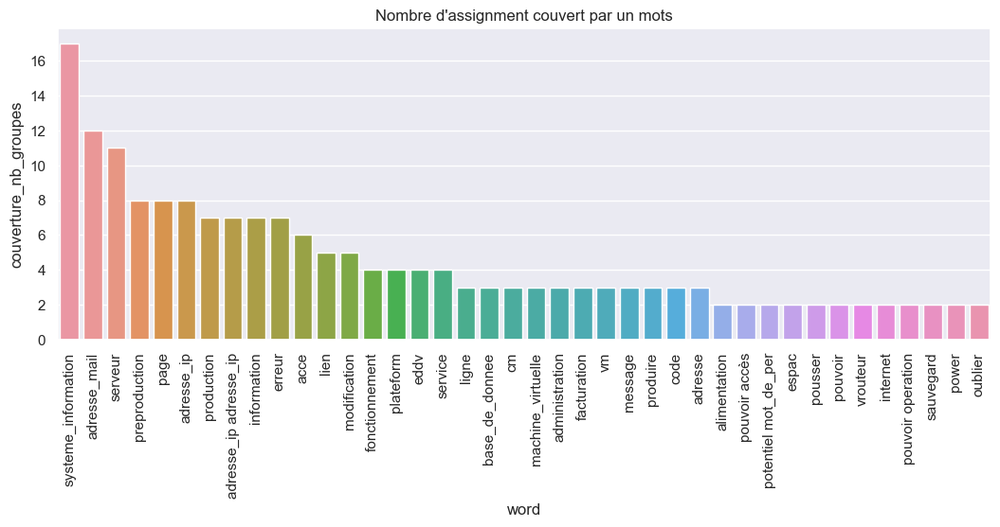

In [54]:
sns.set(rc={'figure.figsize':(12.7,4.27)})

sns.barplot(data = df.iloc[:40] , 
            x = 'word' , 
            y = 'couverture_nb_groupes').set_title('Nombre d\'assignment couvert par un mots' , fontsize = 12)
plt.xticks(rotation = 90)
plt.show()

In [55]:
# Classe à virer
# eeeee comme texte 

data_prepared[data_prepared.assignment_group == assignement_group[37]]

,index,number,priority,assignment_group,product,nb_echanges,first_msg_ortho_stopW_synonyme,lem_tokens,lem_text,target
9470,9470,CS0001285,4 - Low,Support DNS hébergement,Services à la demande,1,eeeee,[eeeee],eeeee,16


#### bi-grams

In [56]:
# Jouer avec min_df
vec_bi_gram = TfidfVectorizer(min_df = min(1 , df_.shape[0]), 
                              #binary = True, 
                              use_idf=True, 
                              norm = None , 
                              ngram_range = (2,2))
                              
vec_bi_gram.fit(df_.lem_text)

TfidfVectorizer(ngram_range=(2, 2), norm=None)

In [57]:
tfidf_bigram_data = vec_bi_gram.transform(df_.lem_text)
tfidf_bigram_data = pd.DataFrame(tfidf_bigram_data.todense(), columns=vec_bi_gram.get_feature_names())
print(tfidf_bigram_data.shape)
tfidf_bigram_data.head()

(9391, 102043)


,aaaf rwkn,aabbbaabbdab adobe,aace cfb,aadlimmofr runtoolpage,aadst account,aadst application,aae whatevervilo,aauthorization basic,ab cafe,ab ffdfb,ab with,abandonn contact,abandonn issue,abandonn page,abandonner adresse_mail,abandonner aimer,abandonner certificat,abandonner domaine,abandonner grâce,abandonner navigateur,abandonner profit,abandonner régulièrement,abandonner vel,abandonner échéance,abbay charlieu,abbeville algorithm,abbinant travaillé,abbr titl,abcd lien,abcd procedur,abcd renseigner,abcd sembla,abdbeb typ,abdelhafidh adresse_mail,abdessamad znagui,abefad adresse_ip,abi cli,abjuridique gib,abl acce,abl add,abl because,abl giv,able acce,abm different,abm mdp,abo ign,abo mensuelle,abonnement résilier,abonnemer actualite,abonnemer an,abonnemer avoir,abonnemer bascule,abonnemer cm,abonnemer cmseolas,abonnemer compris,abonnemer difference,abonnemer domaine,abonnemer dpt,abonnemer dsv,abonnemer définitif,abonnemer démarch,abonnemer eau,abonnemer factur,abonnemer fonctionner,abonnemer forum,abonnemer identifier,abonnemer lecteur,abonnemer licier,abonnemer lien,abonnemer liste,abonnemer mensuel,abonnemer newsletter,abonnemer participer,abonnemer prendre,abonnemer recevoir,abonnemer recontacter,abonnemer renseignement,abonnemer résilier,abonnemer serviciel,abonnemer simultanement,abord assurer,abord authentifier,abord commencer,abord erreur,abord image,abord invite,abord joindre,abord meilleur,abord preproduction,abord produit,abord systeme_information,abord tien,abord valider,abord vouloir,abord élément,aborder certificat,aborder conservon,aborder nombreux,aborted could,aborting fichier,abourouh adnan,abourouh adresse_mail,about connect,about deleting,about dmarc,about environmer,about information,about permission,abouti bloquer,abouti lod,aboutier gt,aboutir adresse_mail,aboutir code,aboutir erreur,aboutir forcément,aboutir mamma,aboutir office,aboutir page,aboutir spam,aboutir systeme_information,aboutir tablette,aboutir tim,aboutir trois,aboutir vouloir,aboutit cube,aboutit essayer,aboutit jamais,above are,above poc,above reference,aboweb edwv,aboweb toucher,abr adresse_ip,abr cad,abr cooperativ,abr domaine,abr information,abr mijanvier,abr parvenir,abr prendre,abr probleme,abr recalculer,abr remontée,abr remplacer,abr ssl,abr transfèr,abr trois,abraham adresse_mail,abraham incident,abrasif name,abrasif partner,abrasivescom eshop,abrasivesxx phenicsxxx,abrconf insérer,abrcoop desbiolle,abrcoop tam,abriter vhost,abrtco service,absense eulalie,absent achat,absent adresse_mail,absent ajouter,absent arrêt,absent ecommerce,absent gt,absent landing,absent loin,absent racine,absent serveur,absent villar,absie adresse,absolu fichier,absolu program,absolu réserve,absolument acce,absolument couper,absolument ddo,absolument décision,absolument effacer,absolument endroit,absolument fonctionner,absolument mise_a_jour,absolument nmessag,absolument professionnel,absolument soyon,absolut left,absolut list,absolut systeme_information,absolut top,absorption vente,abspowertxt retrouve,abstraction noarch,abto baie,abus adresse_mail,abus dfaripe,abus gitlab,abus phone,abuseipdb adresse_ip,abuseipdb src,abyme guadeloup,ac biomerieuxxn,acaffe exp,acbmorincom wwwacbmorincom,acbpluscom gt,acbpluseu wwwacbpluseu,acbplusfr wwwacbplusfr,accceuil plateform,acce acce,acce account,acce accès,acce accédon,acce achatvill,acce actif,acce activiter,acce adherer,acce administration,acce adress,acce adresse,acce adresse_ip,acce adresse_mail,acce adéquat,acce aep,acce affecter,acce agence,acce alimenter,acce aller,acce alter,acce amp,acce améliorer,acce ancien,acce anglais,acce angler,acce antony,acce api,acce appartement,acce appconfig,acce appel,acce appli,acce applicatif,acce application,acce archiv,acce arrive,acce asp,acce aspmail,acce assister,acce association,acce atelier,acce attaquer,acce attrapide,acce auparavant,...,évoluent impact,évoluer api,évoluer captcha,évoluer comportement,évoluer composer,évoluer encadrer,évoluer fonctionnement,évolu

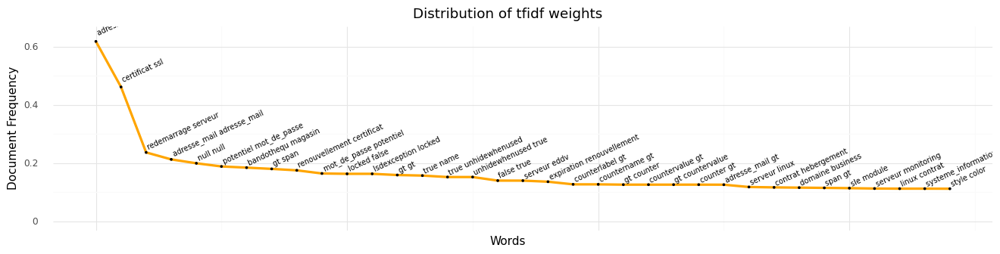

<ggplot: (78966096511)>

In [58]:
df = pd.DataFrame(tfidf_bigram_data.mean(0).sort_values(ascending = False)).reset_index()
df.columns = ['word', 'count']
df['x_axis'] = np.arange(0, len(df))

gg_word_importance(df, 
                   x = 'word')

In [59]:
donnees_totales_2 = pd.concat([tfidf_bigram_data.reset_index(drop=True),
                               pd.DataFrame(labels).reset_index(drop = True)] , 
                              axis = 1)
donnees_totales_2.head()

,aaaf rwkn,aabbbaabbdab adobe,aace cfb,aadlimmofr runtoolpage,aadst account,aadst application,aae whatevervilo,aauthorization basic,ab cafe,ab ffdfb,ab with,abandonn contact,abandonn issue,abandonn page,abandonner adresse_mail,abandonner aimer,abandonner certificat,abandonner domaine,abandonner grâce,abandonner navigateur,abandonner profit,abandonner régulièrement,abandonner vel,abandonner échéance,abbay charlieu,abbeville algorithm,abbinant travaillé,abbr titl,abcd lien,abcd procedur,abcd renseigner,abcd sembla,abdbeb typ,abdelhafidh adresse_mail,abdessamad znagui,abefad adresse_ip,abi cli,abjuridique gib,abl acce,abl add,abl because,abl giv,able acce,abm different,abm mdp,abo ign,abo mensuelle,abonnement résilier,abonnemer actualite,abonnemer an,abonnemer avoir,abonnemer bascule,abonnemer cm,abonnemer cmseolas,abonnemer compris,abonnemer difference,abonnemer domaine,abonnemer dpt,abonnemer dsv,abonnemer définitif,abonnemer démarch,abonnemer eau,abonnemer factur,abonnemer fonctionner,abonnemer forum,abonnemer identifier,abonnemer lecteur,abonnemer licier,abonnemer lien,abonnemer liste,abonnemer mensuel,abonnemer newsletter,abonnemer participer,abonnemer prendre,abonnemer recevoir,abonnemer recontacter,abonnemer renseignement,abonnemer résilier,abonnemer serviciel,abonnemer simultanement,abord assurer,abord authentifier,abord commencer,abord erreur,abord image,abord invite,abord joindre,abord meilleur,abord preproduction,abord produit,abord systeme_information,abord tien,abord valider,abord vouloir,abord élément,aborder certificat,aborder conservon,aborder nombreux,aborted could,aborting fichier,abourouh adnan,abourouh adresse_mail,about connect,about deleting,about dmarc,about environmer,about information,about permission,abouti bloquer,abouti lod,aboutier gt,aboutir adresse_mail,aboutir code,aboutir erreur,aboutir forcément,aboutir mamma,aboutir office,aboutir page,aboutir spam,aboutir systeme_information,aboutir tablette,aboutir tim,aboutir trois,aboutir vouloir,aboutit cube,aboutit essayer,aboutit jamais,above are,above poc,above reference,aboweb edwv,aboweb toucher,abr adresse_ip,abr cad,abr cooperativ,abr domaine,abr information,abr mijanvier,abr parvenir,abr prendre,abr probleme,abr recalculer,abr remontée,abr remplacer,abr ssl,abr transfèr,abr trois,abraham adresse_mail,abraham incident,abrasif name,abrasif partner,abrasivescom eshop,abrasivesxx phenicsxxx,abrconf insérer,abrcoop desbiolle,abrcoop tam,abriter vhost,abrtco service,absense eulalie,absent achat,absent adresse_mail,absent ajouter,absent arrêt,absent ecommerce,absent gt,absent landing,absent loin,absent racine,absent serveur,absent villar,absie adresse,absolu fichier,absolu program,absolu réserve,absolument acce,absolument couper,absolument ddo,absolument décision,absolument effacer,absolument endroit,absolument fonctionner,absolument mise_a_jour,absolument nmessag,absolument professionnel,absolument soyon,absolut left,absolut list,absolut systeme_information,absolut top,absorption vente,abspowertxt retrouve,abstraction noarch,abto baie,abus adresse_mail,abus dfaripe,abus gitlab,abus phone,abuseipdb adresse_ip,abuseipdb src,abyme guadeloup,ac biomerieuxxn,acaffe exp,acbmorincom wwwacbmorincom,acbpluscom gt,acbpluseu wwwacbpluseu,acbplusfr wwwacbplusfr,accceuil plateform,acce acce,acce account,acce accès,acce accédon,acce achatvill,acce actif,acce activiter,acce adherer,acce administration,acce adress,acce adresse,acce adresse_ip,acce adresse_mail,acce adéquat,acce aep,acce affecter,acce agence,acce alimenter,acce aller,acce alter,acce amp,acce améliorer,acce ancien,acce anglais,acce angler,acce antony,acce api,acce appartement,acce appconfig,acce appel,acce appli,acce applicatif,acce application,acce archiv,acce arrive,acce asp,acce aspmail,acce assister,acce association,acce atelier,acce attaquer,acce attrapide,acce auparavant,...,évoluer api,évoluer captcha,évoluer comportement,évoluer composer,évoluer encadrer,évoluer fonctionnement,évoluer fonctionner,é

In [60]:
donnees_totales_2.isna().sum()

aaaf rwkn                 0
aabbbaabbdab adobe        0
aace cfb                  0
aadlimmofr runtoolpage    0
aadst account             0
                         ..
œuvre impact              0
œuvre principe            0
œuvre securit             0
œuvre terme               0
assignment_group          0
Length: 102044, dtype: int64

0


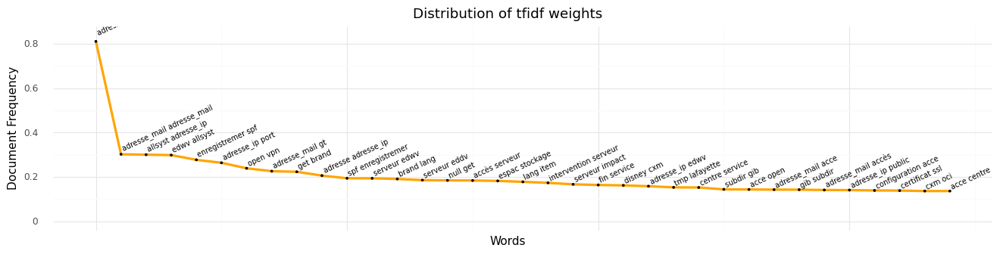


1


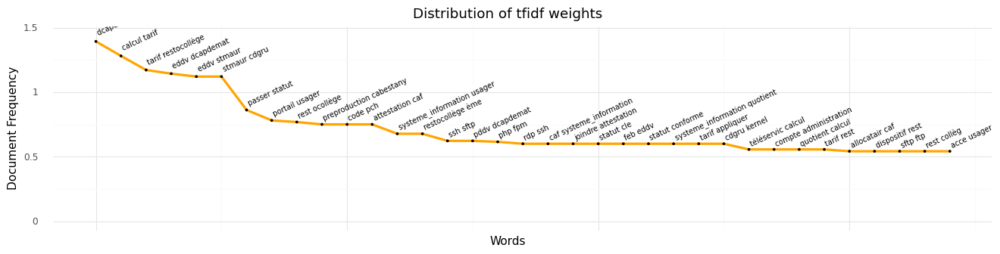


2


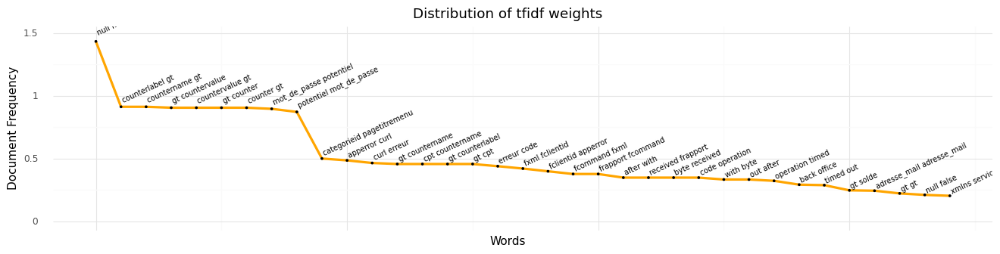


3


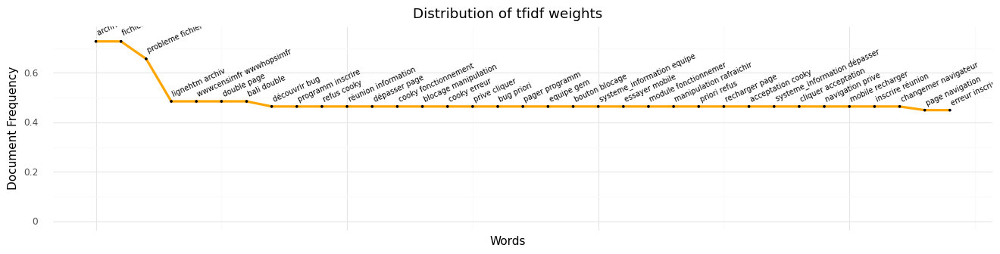


4


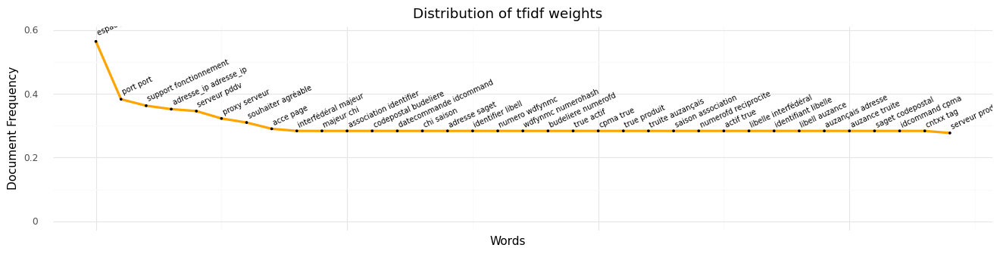


5


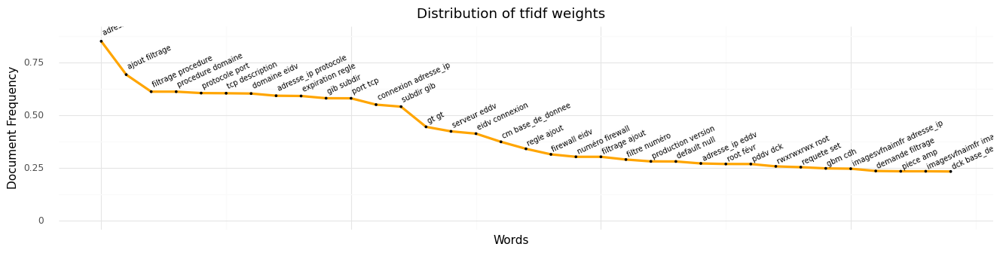


6


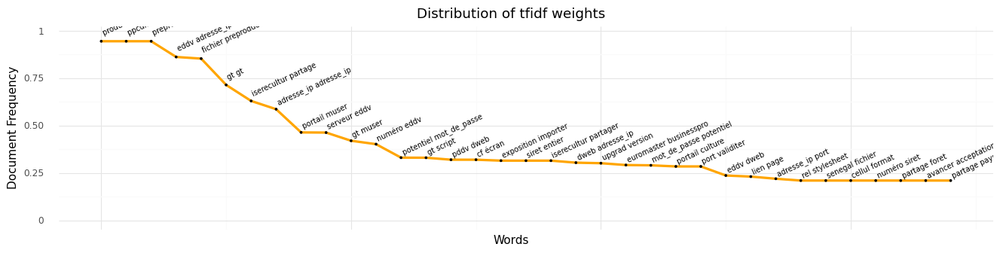


7


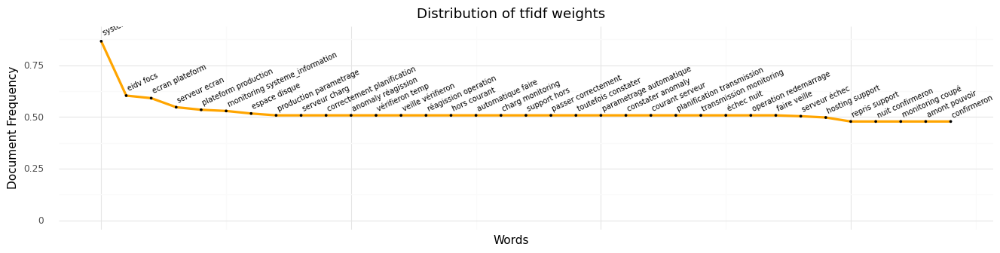


8


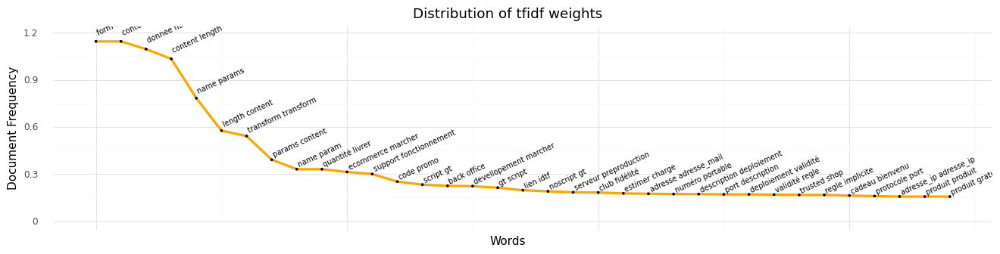


9


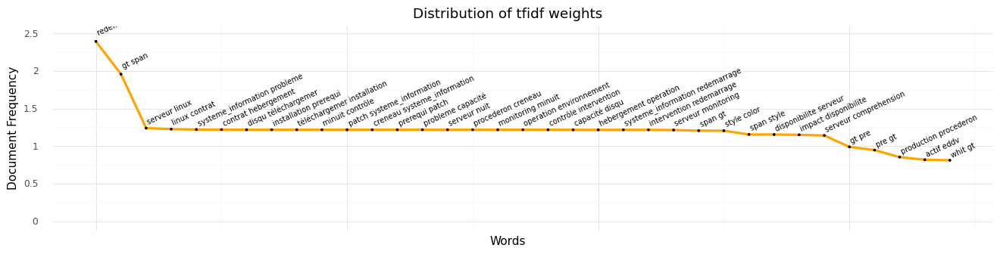


10


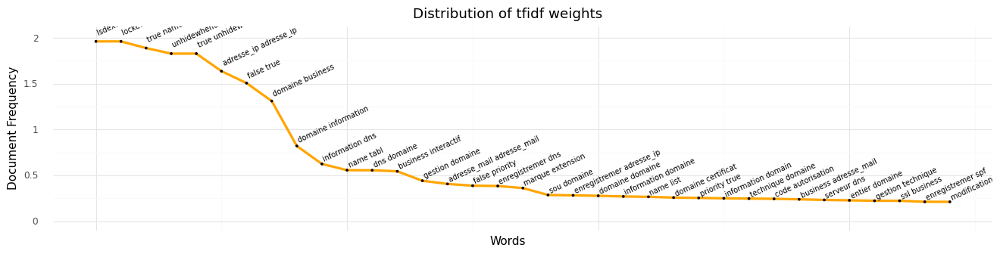


11


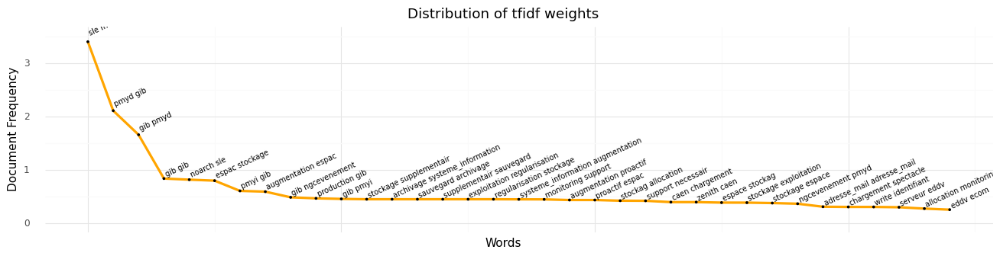


12


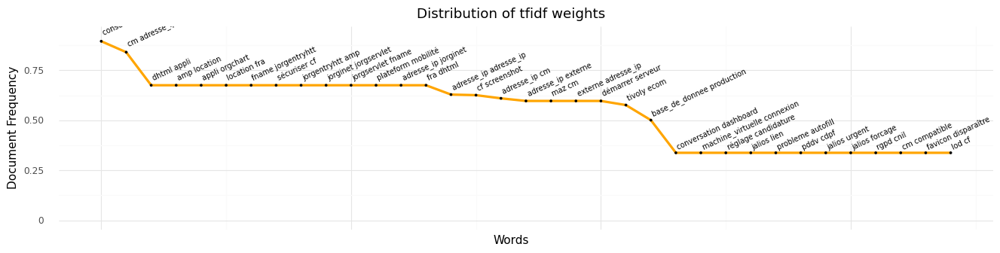


13


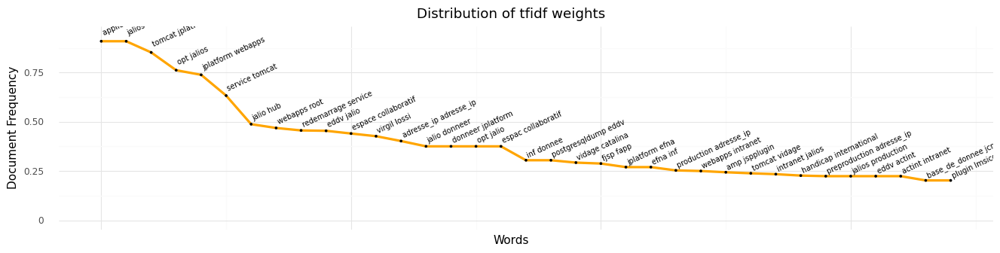


14


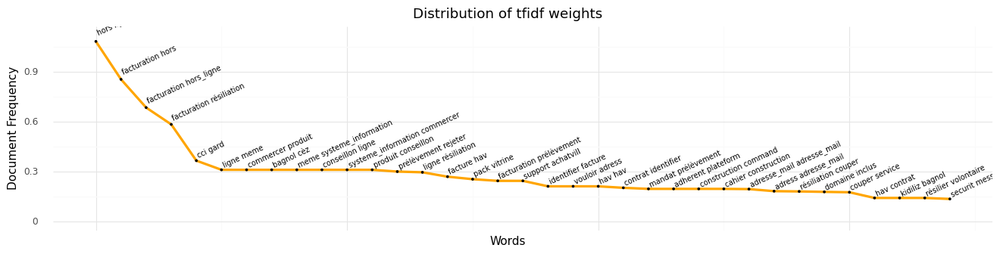


15


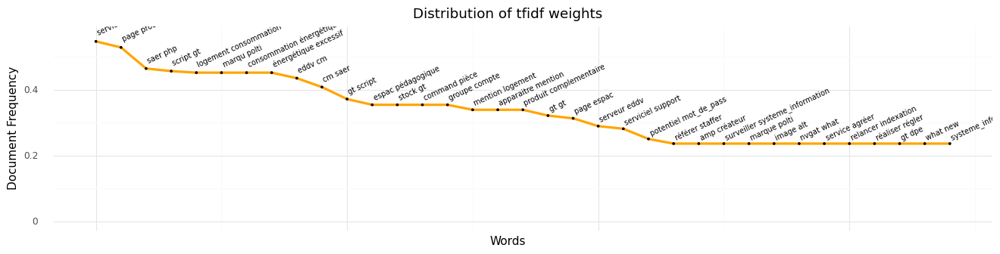


16


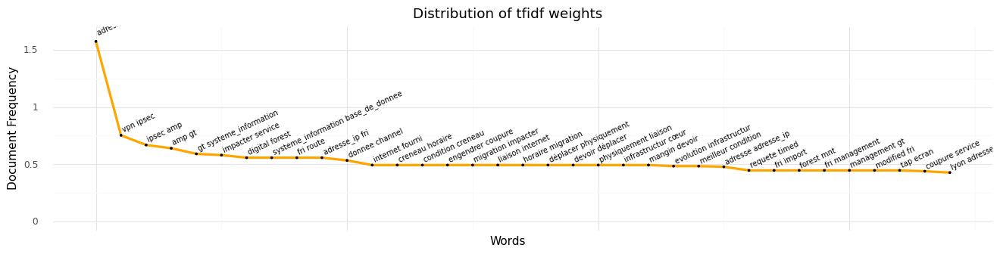


17


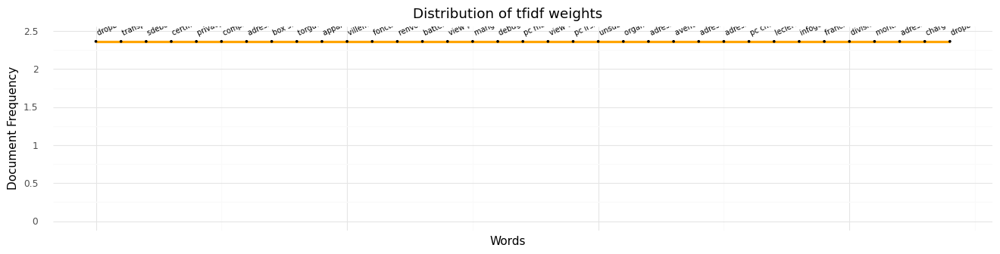


18


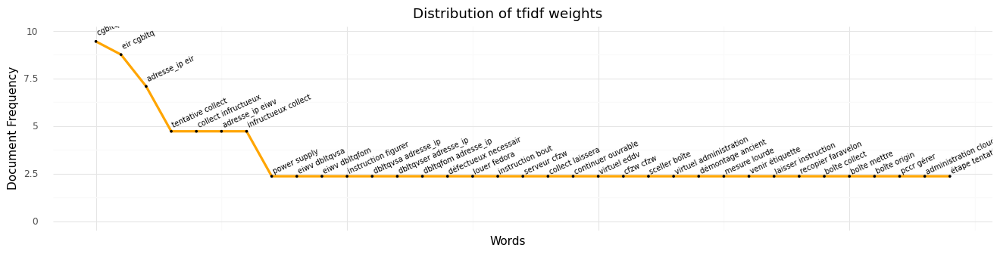


19


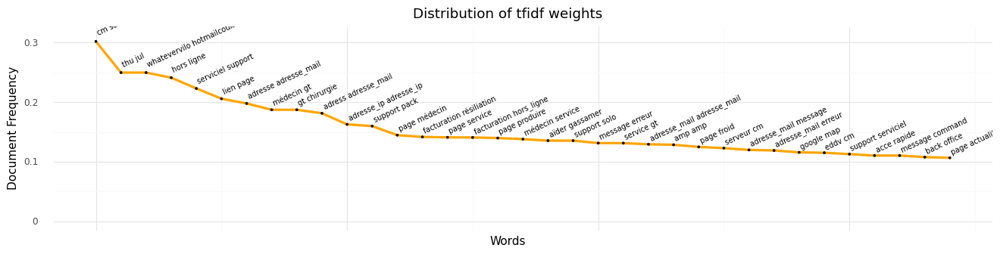


20


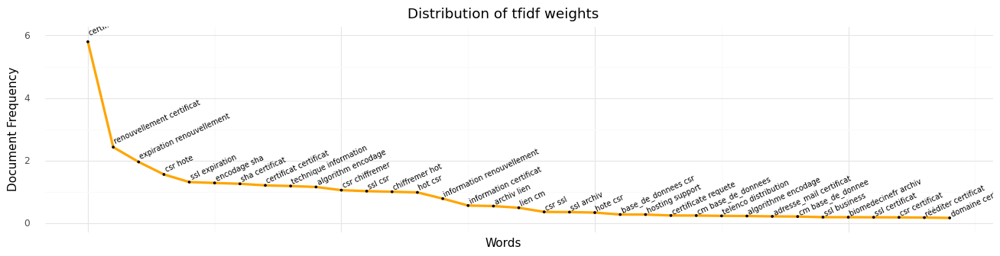


21


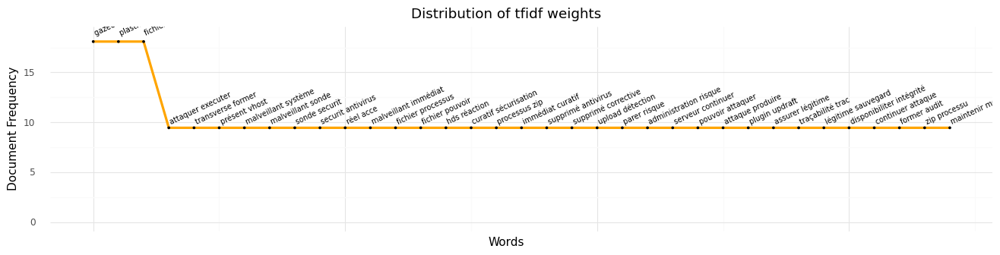


22


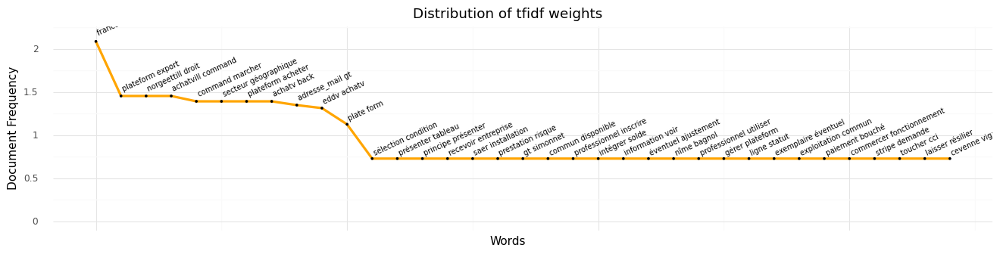


23


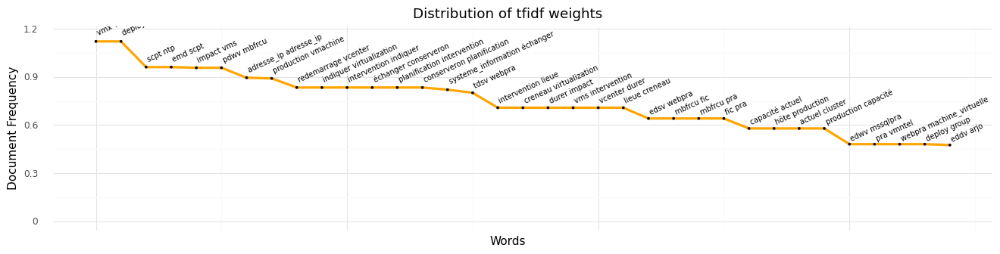


24


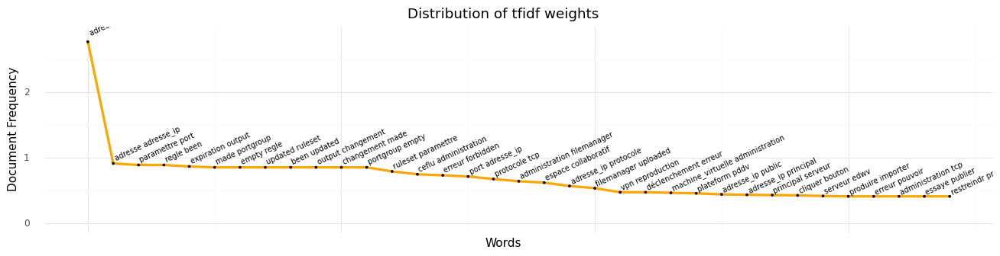


25


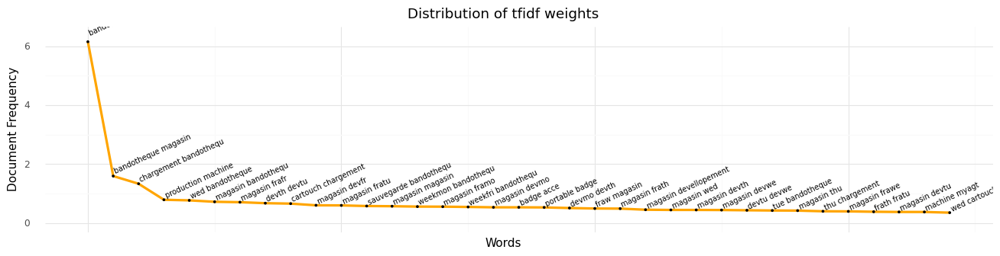


26


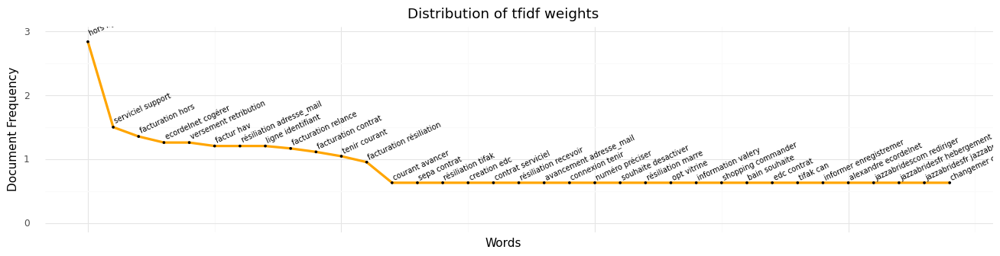


27


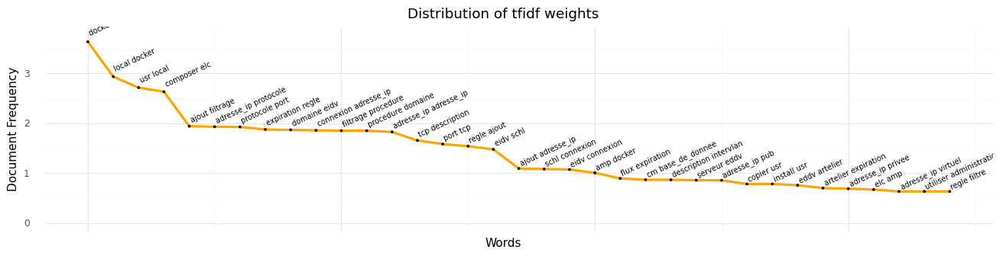


28


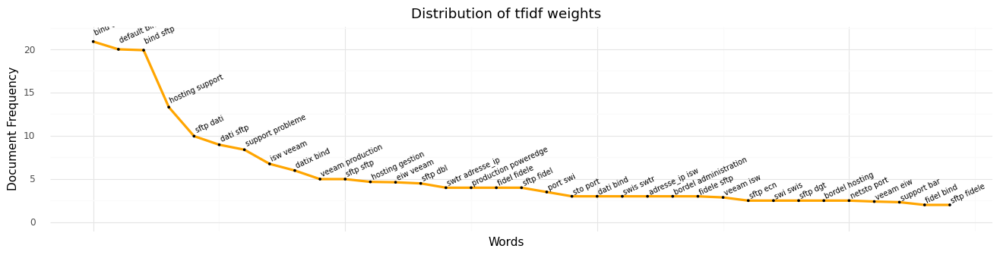


29


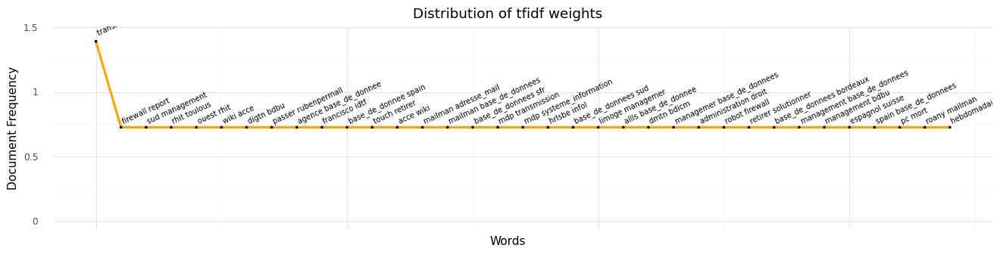


30


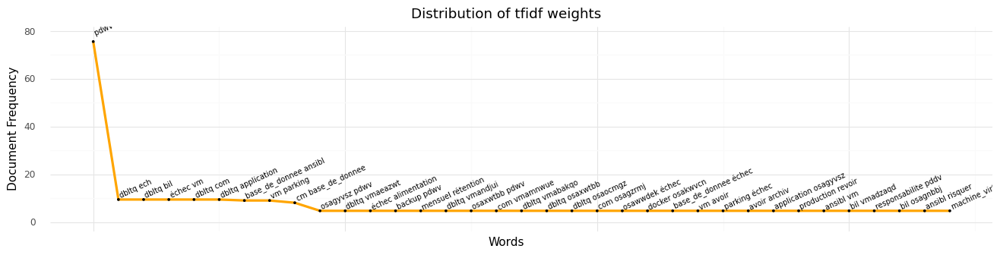


31


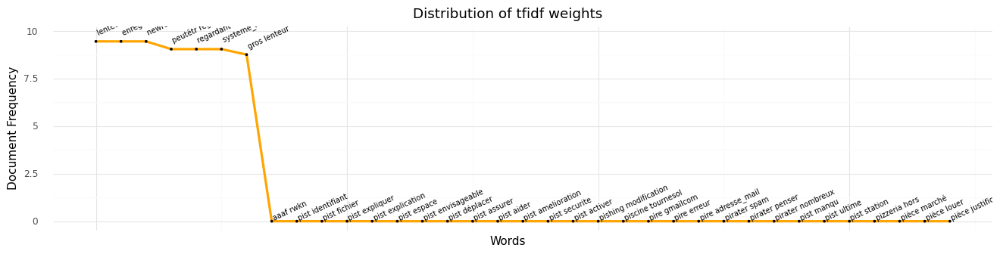


32


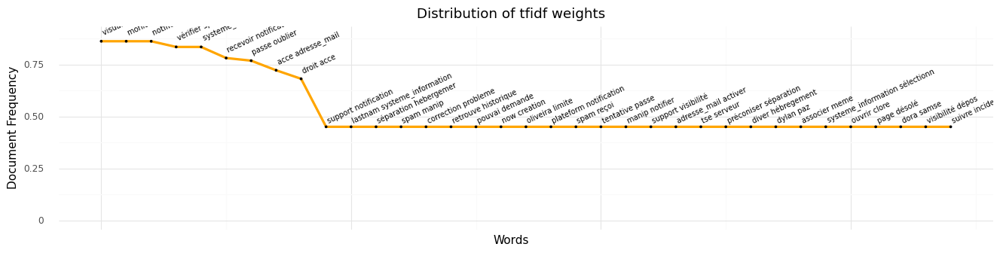


33


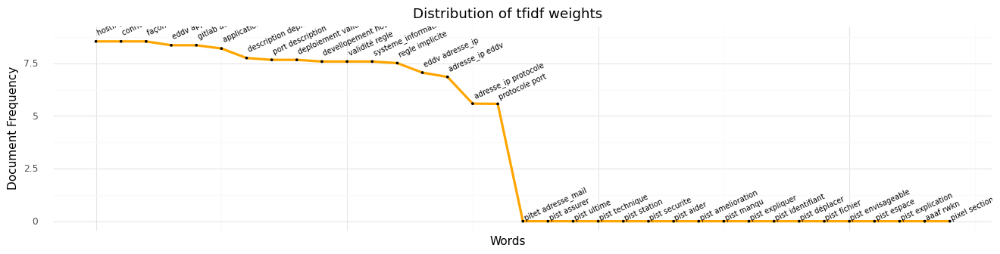


34


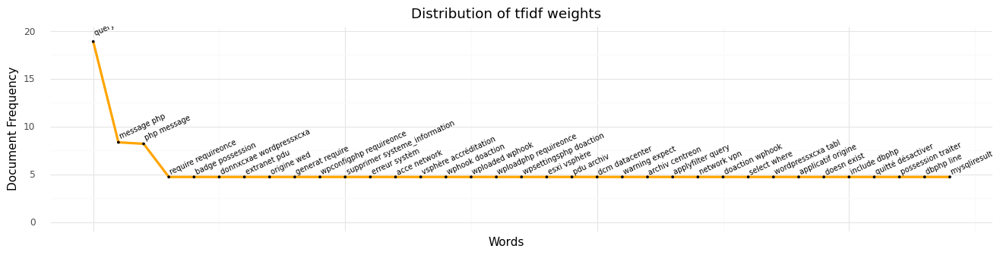


35


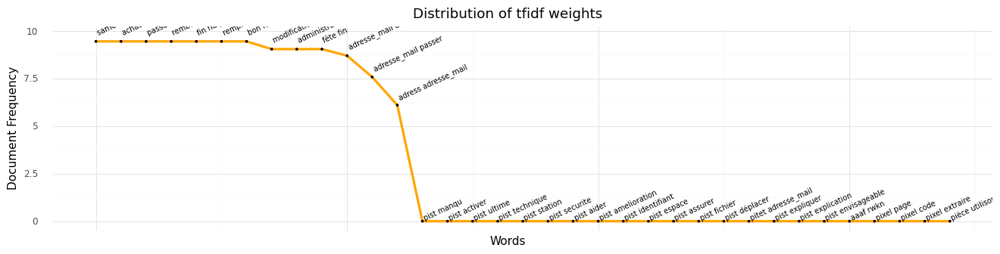


36


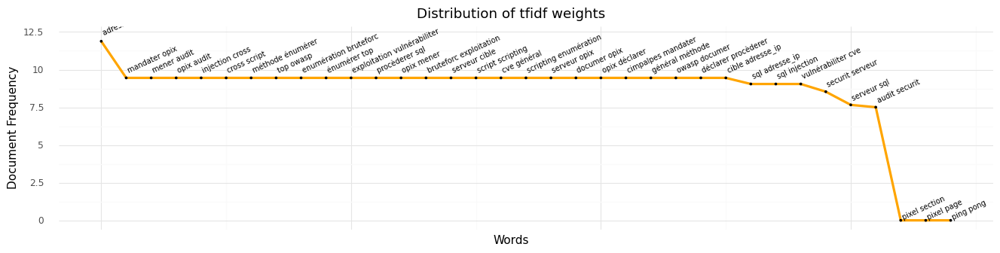


37


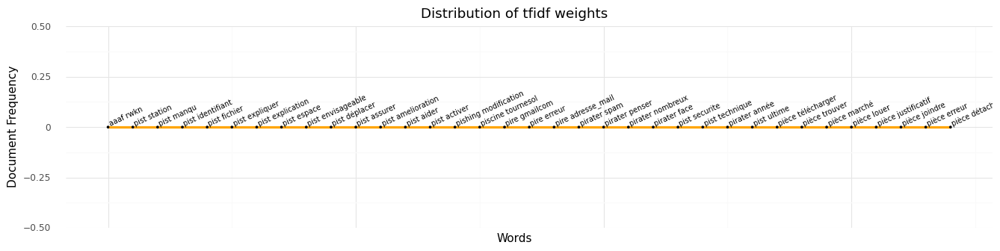

In [61]:
for i in range(len(assignement_group)):
    print(i)
    df = donnees_totales_2[donnees_totales_2.assignment_group == assignement_group[i]]
    df = pd.DataFrame(df.mean(0).sort_values(ascending = False)).reset_index()
    df.columns = ['word', 'count']
    df['x_axis'] = np.arange(0, len(df))

    #print(df.head(1))
    #break;
    
    print(gg_word_importance(df, 
                             x = 'word'))

#### Classification pour identifier les groupes les plus problematiques

In [62]:
# Separation variables explicatives et variable cible

X = tfidf_data
y = labels

In [63]:
# Nombre d'enregistrements par assignment_group

donnees_totales.assignment_group.value_counts()

Support hébergement                                     2928
Support de fonctionnement applicatif                    1307
Chefs de projets Techniques hébergement                  850
Support Nom de Domaine                                   781
Support Certificats SSL                                  603
Support CSI (N2 LX) hébergement                          406
Support N2 Symfony / e-commerce                          314
Chefs de projets Solution (SDM) hébergement              314
Support Serviciels                                       303
Support DCM hébergement                                  279
Support CSI (N2 MS) hébergement                          218
Support N2 Jalios                                        140
Support Achatville                                       135
Support N2 CMS.eolas                                     100
Support N2 Drupal                                         90
Support COSSI (N2 Sécurité) hébergement                   89
Support Réseau (NET) héb

In [64]:
# Donnees d'entrainement vs donnees de test

X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 123)
print('train :' ,X_train.shape , y_train.shape)
print('test :'  ,X_test.shape , y_test.shape)

train : (7512, 3255) (7512,)
test : (1879, 3255) (1879,)


#### -+ Reg Log par defaut

In [65]:
# Regression logistique avec parametres par defaut pour avoir une premiere idée des performances de la classification

reg_log = LogisticRegression(multi_class='multinomial', 
                             solver = 'saga')
reg_log.fit(X_train , y_train)

LogisticRegression(multi_class='multinomial', solver='saga')

In [66]:
# Prediction sur nos donnees de test

y_pred = reg_log.predict(X_test)

In [67]:
# Classification report

print(classification_report(y_test, y_pred))

                                                      precision    recall  f1-score   support

                                             Accueil       0.00      0.00      0.00         2
             Administrateurs fonctionnels ServiceNow       0.00      0.00      0.00         3
                                Chefs de projets SDI       0.00      0.00      0.00         3
         Chefs de projets Solution (SDM) hébergement       0.35      0.18      0.24        73
             Chefs de projets Techniques hébergement       0.49      0.39      0.43       178
                            Equipe Build hébergement       0.00      0.00      0.00        10
                                 Equipe Webmarketing       0.00      0.00      0.00        11
                                         Facturation       0.00      0.00      0.00         2
                                  Support Achatville       0.68      0.45      0.54        29
             Support COSSI (N2 Sécurité) hébergement       

In [68]:
# Les trois classes les mieux classées f1-score >= 0.80

# Support Certificats SSL 
# Support DCM hébergement
# Support Nom de Domaine

# Les deux plus grosses classes ont un f1-score moyen = 0.60

In [69]:
print(balanced_accuracy_score(y_test, y_pred))

0.22694117811370323


In [70]:
# ==> On a pleins de classes avec pas assez de donnees
# ==> Le classifieur est mauvais sur plusieurs classes
# ==> L'accuracy balanced est de 0.22

#### -+ RF par defaut pour feature importances

In [71]:
rf = RandomForestClassifier()
rf.fit(X_train , y_train)

RandomForestClassifier()

In [72]:
y_pred = rf.predict(X_test)

In [73]:
print(classification_report(y_test, y_pred))

                                                      precision    recall  f1-score   support

                                             Accueil       0.00      0.00      0.00         2
             Administrateurs fonctionnels ServiceNow       0.00      0.00      0.00         3
                                Chefs de projets SDI       0.00      0.00      0.00         3
         Chefs de projets Solution (SDM) hébergement       0.39      0.16      0.23        73
             Chefs de projets Techniques hébergement       0.62      0.34      0.44       178
                            Equipe Build hébergement       0.00      0.00      0.00        10
                                 Equipe Webmarketing       1.00      0.09      0.17        11
                                         Facturation       0.00      0.00      0.00         2
                                  Support Achatville       0.56      0.31      0.40        29
             Support COSSI (N2 Sécurité) hébergement       

In [74]:
# Variables les plus importantes

feature_names = donnees_totales.columns[:-1]
importances = rf.feature_importances_
rf_importances = pd.DataFrame(importances, index=feature_names).reset_index()\
                                                               .set_axis(['features','importances'] , axis = 1)\
                                                               .sort_values( by =['importances'] , ascending = False)

In [75]:
rf_importances

,features,importances
919,domaine,0.013662
461,certificat,0.010381
2661,serveur,0.010097
470,certificat ssl,0.009664
899,dns,0.007267
...,...,...
3140,viser limiter,0.000000
2887,systematiqu annulion,0.000000
2170,pouvoir operation,0.000000
1307,fratu frafr,0.000000


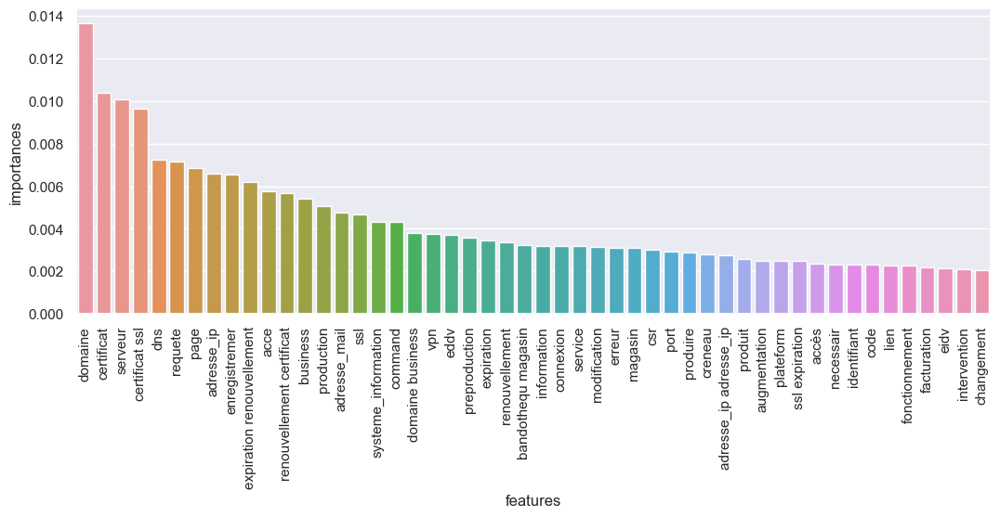

In [76]:
sns.barplot(data = rf_importances.iloc[:50] , x = 'features' , y = 'importances')
plt.xticks(rotation = 90);

#### Etudier la similarite entre les tickets

In [77]:
# ==> Soit on agrege des classes entière en regardant la classe 
#     avec laquelle la majorité de ses tickets est le plus proche

# ==> Soit on re-affecte chaque ticket dans la même classe que celle a laquelle appartient 
#     majoritairement les 7 tickets qui lui sont le plus proche

In [78]:
donnees_totales.head()

,abandonner,abonnemer,abonnemer domaine,abonnemer lien,abord,aboutir,abr,absent,absolument,acce,acce acce,acce adresse,acce adresse_ip,acce adresse_mail,acce centre,acce centreon,acce conduent,acce denied,acce environnement,acce fonctionnement,acce fonctionnemer,acce ftp,acce identifier,acce information,acce interfac,acce internet,acce open,acce page,acce phpmyadmin,acce plateform,acce preproduction,acce production,acce rdp,acce renovation,acce ressource,acce saphir,acce serveur,acce service,acce sftp,acce societe,acce ssh,acce vpn,acceptation,acceptation party,acceptation risque,accompagnement,accompagner,accorder,account,accè,accèder,accès,accès environnement,accès ftp,accès preproduction,accès serveur,accéder,acem,achat,achatvill,acl,acquérir,acte,actif,actif eddv,actif pddv,activation,activer,activité,actu,actualiser,actualite,actuel,adapter,add,address,adherent,adherer,administration,administration serveur,adobe,adress,adress adresse_ip,adress adresse_mail,adresse,adresse adresse_ip,adresse adresse_mail,adresse_ip,adresse_ip acce,adresse_ip accès,adresse_ip adresse_ip,adresse_ip adresse_mail,adresse_ip autorisation,adresse_ip autoriser,adresse_ip changemer,adresse_ip connexion,adresse_ip domaine,adresse_ip eddv,adresse_ip edwv,adresse_ip effectif,adresse_ip enregistremer,adresse_ip erreur,adresse_ip fixe,adresse_ip gt,adresse_ip hostname,adresse_ip identifiant,adresse_ip information,adresse_ip machine_virtuelle,adresse_ip pddv,adresse_ip phpmyadmin,adresse_ip port,adresse_ip preproduction,adresse_ip prestataire,adresse_ip principal,adresse_ip priv,adresse_ip production,adresse_ip protocole,adresse_ip pub,adresse_ip public,adresse_ip remplacement,adresse_ip serveur,adresse_ip service,adresse_ip systeme_information,adresse_ip vpn,adresse_mail,adresse_mail acce,adresse_mail accès,adresse_mail administration,adresse_mail adresse,adresse_mail adresse_ip,adresse_mail adresse_mail,adresse_mail arriver,adresse_mail associer,adresse_mail certificat,adresse_mail changemer,adresse_mail command,adresse_mail dns,adresse_mail domaine,adresse_mail ecommerce,adresse_mail envoyer,adresse_mail erreur,adresse_mail gt,adresse_mail information,adresse_mail message,adresse_mail passer,adresse_mail serveur,adresse_mail spam,adresse_mail systeme_information,adresser,adulte,aefe,affecter,affecté,affichent,afficher,after,again,agence,agir,agréable,aider,aimer,aimerai,ain,air,ajout,ajout adresse_ip,ajout disque,ajout filtrage,ajout nomvlan,ajouter,ajuster,alerter,alfresco,algorithm,algorithm encodage,algorithme,algorithme encodage,alias,alimentation,alimenter,aller,aller page,allocation,allocation monitoring,allocation partition,allow,allsyst,allsyst adresse_ip,alt,alternatif,aléatoire,amelioration,amont,amont pouvoir,amp,amp amp,améliorer,anahfr,ancien,andré,andré woisard,anglais,annonce,annoncer,annuel,annulation,annuler,annulion,annulion explicite,année,anomalie,anomaly,anomaly réagission,anormal,ansibl,antispam,antiviru,antiviru sonde,antivirus,antivirus viser,any,any adresse_ip,aout,août,apache,apache availabl,apache vitrine,apercevoir,api,apidae,apm,apparaitre,apparaître,apparemment,appartemer,appartemer manuellemer,appartenir,appel,appeler,appli,applicable,applicatif,applicatif charge,applicatif entrainer,applicatif système,application,application firewall,application mobile,application production,...,top,totalement,toucher,toupargel,tourn,tourner,toutefois,toutefois constater,toutefois fassion,trac,trac derogation,trafic,train,traite,traitement,traiter,tranch,transaction,transferer,transferer gestion,transfert,transfert domaine,transférer,transféron,transféron exister,transmet,transmission,transmission lancion,transmission monitoring,transport,travail,travailler,travaillon,traval,travers,tri,trois,trouver,true,try,tse,ttl,tue,tue bandotheque,tue cartouch,typo,typo php,tâche,téléchargement,téléchargemer,téléchargemer installation,télécharger,téléphonique,téléservic,télétravail,tôt,udp,ulterieurement,ulterieurement hebergement,unabl,unavailab

In [79]:
# Fonction qui renvoit pour chaque ticket les 7 tickets qui lui sont le plus proche du point de vue de la distance de cosinus

"""
tfidf_data_cos_plus_proche = {}
n = sorted(list(np.arange(tfidf_data.shape[0])))

for i in range(len(tfidf_data)):
    tab = {}
    m = n.copy()
    tej = m.pop(i)

    for j in m:
        tab[j] = cosine_similarity(tfidf_data.iloc[i].values.reshape(-1, tfidf_data.shape[1]), 
                                   tfidf_data.iloc[j].values.reshape(-1, tfidf_data.shape[1]))[0][0]

    x = list(pd.DataFrame.from_dict(tab , orient='index').reset_index()\
                                                         .set_axis(['line' , 'cos_sim'] , axis = 1)\
                                                         .sort_values(by = ['cos_sim'] , ascending = False)['line']\
                                                         .iloc[:7]\
                                                         .values)

    tfidf_data_cos_plus_proche[i]  = x
"""

"\ntfidf_data_cos_plus_proche = {}\nn = sorted(list(np.arange(tfidf_data.shape[0])))\n\nfor i in range(len(tfidf_data)):\n    tab = {}\n    m = n.copy()\n    tej = m.pop(i)\n\n    for j in m:\n        tab[j] = cosine_similarity(tfidf_data.iloc[i].values.reshape(-1, tfidf_data.shape[1]), \n                                   tfidf_data.iloc[j].values.reshape(-1, tfidf_data.shape[1]))[0][0]\n\n    x = list(pd.DataFrame.from_dict(tab , orient='index').reset_index()                                                         .set_axis(['line' , 'cos_sim'] , axis = 1)                                                         .sort_values(by = ['cos_sim'] , ascending = False)['line']                                                         .iloc[:7]                                                         .values)\n\n    tfidf_data_cos_plus_proche[i]  = x\n"

In [80]:
#tfidf_data_cos_plus_proche                         

In [81]:
#len(tfidf_data_cos_plus_proche) , len(tfidf_data)

In [82]:
mapping_index_assgroup = {i : ass_group for i , ass_group in enumerate(donnees_totales.assignment_group)}
mapping_index_assgroup

{0: 'Support hébergement',
 1: 'Support N2 Capdemat ',
 2: 'Support de fonctionnement applicatif',
 3: 'Support de fonctionnement applicatif',
 4: 'Equipe Webmarketing',
 5: 'Support N2 CMS.eolas',
 6: 'Support CSI (N2 LX) hébergement',
 7: 'Support de fonctionnement applicatif',
 8: 'Support N2 Drupal',
 9: 'Support CSI (N2 MS) hébergement',
 10: 'Support N2 Symfony / e-commerce',
 11: 'Chefs de projets Techniques hébergement',
 12: 'Support Nom de Domaine',
 13: 'Support N2 Drupal',
 14: 'Support Nom de Domaine',
 15: 'Support Nom de Domaine',
 16: 'Support CSI (N2 LX) hébergement',
 17: 'Support CSI (N2 MS) hébergement',
 18: 'Support de fonctionnement applicatif',
 19: 'Support de fonctionnement applicatif',
 20: 'Support N2 CMS.eolas',
 21: 'Support de fonctionnement applicatif',
 22: 'Support N2 Symfony / e-commerce',
 23: 'Support N2 CMS.eolas',
 24: 'Support N2 CMS.eolas',
 25: 'Support de fonctionnement applicatif',
 26: 'Chefs de projets Techniques hébergement',
 27: 'Support

In [83]:
"""
# Pour chaque ticket (topic) les index des 7 tickets qui lui sont le plus proche


df_cos_plus_proche = pd.DataFrame.from_dict(tfidf_data_cos_plus_proche , orient='index').reset_index()\
                                                                                        .set_axis(['topic',
                                                                                                   'first',
                                                                                                   'second',
                                                                                                   'third',
                                                                                                   'fourth',
                                                                                                   'fifth',
                                                                                                   'sixth',
                                                                                                   'seventh'] , axis = 1)

df_cos_plus_proche.head()
"""

"\n# Pour chaque ticket (topic) les index des 7 tickets qui lui sont le plus proche\n\n\ndf_cos_plus_proche = pd.DataFrame.from_dict(tfidf_data_cos_plus_proche , orient='index').reset_index()                                                                                        .set_axis(['topic',\n                                                                                                   'first',\n                                                                                                   'second',\n                                                                                                   'third',\n                                                                                                   'fourth',\n                                                                                                   'fifth',\n                                                                                                   'sixth',\n                                            

In [84]:
#df_cos_plus_proche.to_csv('../data/out/cos_similitudes_entre_assignment_group.csv' , index=False)

In [85]:
df_cos_plus_proche = pd.read_csv('../data/out/cos_similitudes_entre_assignment_group.csv')
print(df_cos_plus_proche.shape)
df_cos_plus_proche.head()

(9391, 8)


,topic,first,second,third,fourth,fifth,sixth,seventh
0,0,1628,518,517,519,6291,6161,3651
1,1,4072,6915,8110,6331,2913,7617,2865
2,2,4454,3262,4511,4064,3334,9311,8198
3,3,5419,751,4433,28,5639,558,2239
4,4,7287,3511,6131,2734,1339,2380,3458


In [86]:
# On remplace l'index des tickets par les labels (assignment_group auxquels ils appartiennent)

df_cos_plus_proche['topic'] = df_cos_plus_proche['topic'].map(mapping_index_assgroup)
df_cos_plus_proche['first'] = df_cos_plus_proche['first'].map(mapping_index_assgroup)
df_cos_plus_proche['second'] = df_cos_plus_proche['second'].map(mapping_index_assgroup)
df_cos_plus_proche['third'] = df_cos_plus_proche['third'].map(mapping_index_assgroup)
df_cos_plus_proche['fourth'] = df_cos_plus_proche['fourth'].map(mapping_index_assgroup)
df_cos_plus_proche['fifth'] = df_cos_plus_proche['fifth'].map(mapping_index_assgroup)
df_cos_plus_proche['sixth'] = df_cos_plus_proche['sixth'].map(mapping_index_assgroup)
df_cos_plus_proche['seventh'] = df_cos_plus_proche['seventh'].map(mapping_index_assgroup)

In [87]:
df_cos_plus_proche

,topic,first,second,third,fourth,fifth,sixth,seventh
0,Support hébergement,Support hébergement,Support N2 Capdemat,Support COSSI (N2 Sécurité) hébergement,Support hébergement,Support hébergement,Support COSSI (N2 Sécurité) hébergement,Support hébergement
1,Support N2 Capdemat,Support de fonctionnement applicatif,Support Nom de Domaine,Support Nom de Domaine,Support hébergement,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support hébergement
2,Support de fonctionnement applicatif,Support hébergement,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support Nom de Domaine,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support hébergement
3,Support de fonctionnement applicatif,Support Nom de Domaine,Support hébergement,Support de fonctionnement applicatif,Support Nom de Domaine,Support Certificats SSL,Support N2 Drupal,Support de fonctionnement applicatif
4,Equipe Webmarketing,Support hébergement,Chefs de projets Techniques hébergement,Support Serviciels,Support de fonctionnement applicatif,Support Serviciels,Support de fonctionnement applicatif,Equipe Webmarketing
...,...,...,...,...,...,...,...,...
9386,Support de fonctionnement applicatif,Support Virtualisation et Cloud (VIRT) héberge...,Support hébergement,Support hébergement,Support N2 Symfony / e-commerce,Support N2 Symfony / e-commerce,Support N2 Symfony / e-commerce,Support N2 Symfony / e-commerce
9387,Support hébergement,Support hébergement,Support Nom de Domaine,Support Nom de Domaine,Support hébergement,Support hébergement,Support hébergement,Support hébergement
9388,Support de fonctionnement applicatif,Chefs de projets Techniques hébergement,Support hébergement,Chefs de projets Techniques hébergement,Support CSI (N2 LX) hébergement,Chefs de projets Techniques hébergement,Support CSI (N2 LX) hébergement,Support hébergement
9389,Support DCM hébergement,Support DCM hébergement,Support DCM hébergement,Chefs de projets Solution (SDM) hébergement,Support hébergement,Support N2 Symfony / e-commerce,Support hébergement,Support DCM hébergement


In [88]:
df_cos_plus_proche.index = df_cos_plus_proche.topic
topic = df_cos_plus_proche.topic
df_cos_plus_proche = df_cos_plus_proche.drop(['topic'] , axis=1)
df_cos_plus_proche.head()

,first,second,third,fourth,fifth,sixth,seventh
topic,,,,,,,
Support hébergement,Support hébergement,Support N2 Capdemat,Support COSSI (N2 Sécurité) hébergement,Support hébergement,Support hébergement,Support COSSI (N2 Sécurité) hébergement,Support hébergement
Support N2 Capdemat,Support de fonctionnement applicatif,Support Nom de Domaine,Support Nom de Domaine,Support hébergement,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support hébergement
Support de fonctionnement applicatif,Support hébergement,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support Nom de Domaine,Support de fonctionnement applicatif,Support de fonctionnement applicatif,Support hébergement
Support de fonctionnement applicatif,Support Nom de Domaine,Support hébergement,Support de fonctionnement applicatif,Support Nom de Domaine,Support Certificats SSL,Support N2 Drupal,Support de fonctionnement applicatif
Equipe Webmarketing,Support hébergement,Chefs de projets Techniques hébergement,Support Serviciels,Support de fonctionnement applicatif,Support Serviciels,Support de fonctionnement applicatif,Equipe Webmarketing


In [89]:
# On transforme notre table en matrice assignment_group X assignment_group avec 
# le nombre de tickets d'un labels en colonnes faisant parti des 7 tickets les plus proches de notre ticket topic

t1 = pd.get_dummies(df_cos_plus_proche['first'].values).reindex(columns=labels.unique(), fill_value=0)
t2 = pd.get_dummies(df_cos_plus_proche['second'].values).reindex(columns=labels.unique(), fill_value=0)
t3 = pd.get_dummies(df_cos_plus_proche['third'].values).reindex(columns=labels.unique(), fill_value=0)
t4 = pd.get_dummies(df_cos_plus_proche['fourth'].values).reindex(columns=labels.unique(), fill_value=0)
t5 = pd.get_dummies(df_cos_plus_proche['fifth'].values).reindex(columns=labels.unique(), fill_value=0)
t6 = pd.get_dummies(df_cos_plus_proche['sixth'].values).reindex(columns=labels.unique(), fill_value=0)
t7 = pd.get_dummies(df_cos_plus_proche['seventh'].values).reindex(columns=labels.unique(), fill_value=0)

df_t = t1+t2+t3+t4+t5+t6+t7
df_t.index = topic
df_t = df_t.reset_index()
print(df_t.shape)
df_t.head()

(9391, 39)


,topic,Support hébergement,Support N2 Capdemat,Support de fonctionnement applicatif,Equipe Webmarketing,Support N2 CMS.eolas,Support CSI (N2 LX) hébergement,Support N2 Drupal,Support CSI (N2 MS) hébergement,Support N2 Symfony / e-commerce,Chefs de projets Techniques hébergement,Support Nom de Domaine,Chefs de projets Solution (SDM) hébergement,Chefs de projets SDI,Support N2 Jalios,Support Achatville,Support N2 Serviciels,Support Réseau (NET) hébergement,Accueil,Support Hardware hébergement,Support Serviciels,Support Certificats SSL,Support N2 WordPress,Support N2 Achatville,Support Virtualisation et Cloud (VIRT) hébergement,Support COSSI (N2 Sécurité) hébergement,Support DCM hébergement,Facturation,Equipe Build hébergement,Support Stockage et Sauvegarde (BAR/STO) hébergement,Support Informatique Interne,Support Industrialisation hébergement,Support Monitoring hébergement,Administrateurs fonctionnels ServiceNow,Support Industrialisation SDI,Pilotage Support hébergement,Support MPDML,Responsables Comptes Clients,Support DNS hébergement
0,Support hébergement,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Support N2 Capdemat,2,0,3,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Support de fonctionnement applicatif,2,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Support de fonctionnement applicatif,1,0,2,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Equipe Webmarketing,1,0,2,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [90]:
# On normalise les poids pour afficher la heatmap des similarités 
# Prendre uniquement quand on a une grande difference entre la première classe proche et la seconde

df_t_gb = df_t.groupby(['topic']).sum()
df_t_gb = df_t_gb.astype(float)
df_t_gb = (df_t_gb.T / df_t_gb.T.sum()).T*100
df_t_gb = df_t_gb.apply(lambda x : round(x,2))
print(df_t_gb.shape)
df_t_gb

(38, 38)


,Support hébergement,Support N2 Capdemat,Support de fonctionnement applicatif,Equipe Webmarketing,Support N2 CMS.eolas,Support CSI (N2 LX) hébergement,Support N2 Drupal,Support CSI (N2 MS) hébergement,Support N2 Symfony / e-commerce,Chefs de projets Techniques hébergement,Support Nom de Domaine,Chefs de projets Solution (SDM) hébergement,Chefs de projets SDI,Support N2 Jalios,Support Achatville,Support N2 Serviciels,Support Réseau (NET) hébergement,Accueil,Support Hardware hébergement,Support Serviciels,Support Certificats SSL,Support N2 WordPress,Support N2 Achatville,Support Virtualisation et Cloud (VIRT) hébergement,Support COSSI (N2 Sécurité) hébergement,Support DCM hébergement,Facturation,Equipe Build hébergement,Support Stockage et Sauvegarde (BAR/STO) hébergement,Support Informatique Interne,Support Industrialisation hébergement,Support Monitoring hébergement,Administrateurs fonctionnels ServiceNow,Support Industrialisation SDI,Pilotage Support hébergement,Support MPDML,Responsables Comptes Clients,Support DNS hébergement
topic,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Accueil,42.86,0.00,14.29,0.00,0.00,3.57,3.57,0.00,0.00,7.14,7.14,3.57,0.00,0.00,3.57,0.00,7.14,0.00,0.00,3.57,3.57,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
Administrateurs fonctionnels ServiceNow,33.33,0.00,17.01,0.00,0.68,2.04,0.00,2.72,6.12,6.80,9.52,2.04,0.00,0.00,1.36,1.36,0.68,0.00,0.00,4.76,0.68,0.00,0.00,0.68,0.00,0.00,0.00,0.68,0.00,2.04,0.00,0.00,7.48,0.00,0.00,0.00,0.00,0.0
Chefs de projets SDI,34.18,0.00,14.80,1.02,2.04,5.61,2.55,1.53,4.08,5.61,9.69,0.51,3.57,3.06,1.53,1.02,1.02,0.00,0.00,2.04,0.00,0.00,0.00,0.51,1.02,4.59,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
Chefs de projets Solution (SDM) hébergement,36.17,0.14,5.69,0.09,1.05,3.96,0.82,3.55,1.18,8.05,4.28,20.66,0.23,0.73,1.27,0.36,0.86,0.05,0.09,1.46,1.68,0.05,0.05,1.27,0.68,2.59,0.23,1.73,0.50,0.32,0.05,0.00,0.14,0.00,0.00,0.00,0.05,0.0
Chefs de projets Techniques hébergement,27.93,0.37,4.10,0.07,0.39,7.09,0.71,1.68,1.33,41.41,3.01,3.33,0.24,0.59,0.29,0.29,0.74,0.03,0.03,0.76,1.68,0.00,0.02,0.69,0.64,0.25,0.00,1.66,0.25,0.18,0.00,0.00,0.20,0.00,0.02,0.02,0.02,0.0
Equipe Build hébergement,22.40,0.71,2.47,0.18,0.00,12.35,3.70,2.82,1.06,19.22,5.82,3.17,0.00,0.35,0.35,0.00,0.71,0.00,0.18,0.35,6.00,0.00,0.00,0.53,3.70,0.00,0.00,13.05,0.00,0.35,0.00,0.00,0.53,0.00,0.00,0.00,0.00,0.0
Equipe Webmarketing,24.54,0.00,25.27,2.20,1.10,2.20,1.10,2.56,4.40,2.93,8.06,2.93,0.73,2.20,1.83,3.30,0.37,0.00,0.00,10.62,1.47,0.00,0.00,0.00,0.37,0.37,0.00,0.37,0.37,0.37,0.00,0.00,0.37,0.00,0.00,0.00,0.00,0.0
Facturation,4.76,0.00,8.57,0.00,0.00,0.95,0.00,0.00,0.00,0.00,6.67,1.90,0.00,0.00,50.48,0.95,0.00,0.00,0.00,14.29,1.90,0.00,0.00,0.00,0.00,0.95,8.57,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
Pilotage Support hébergement,28.57,0.00,0.00,0.00,0.00,0.00,7.14,0.00,0.00,7.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.14,50.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0


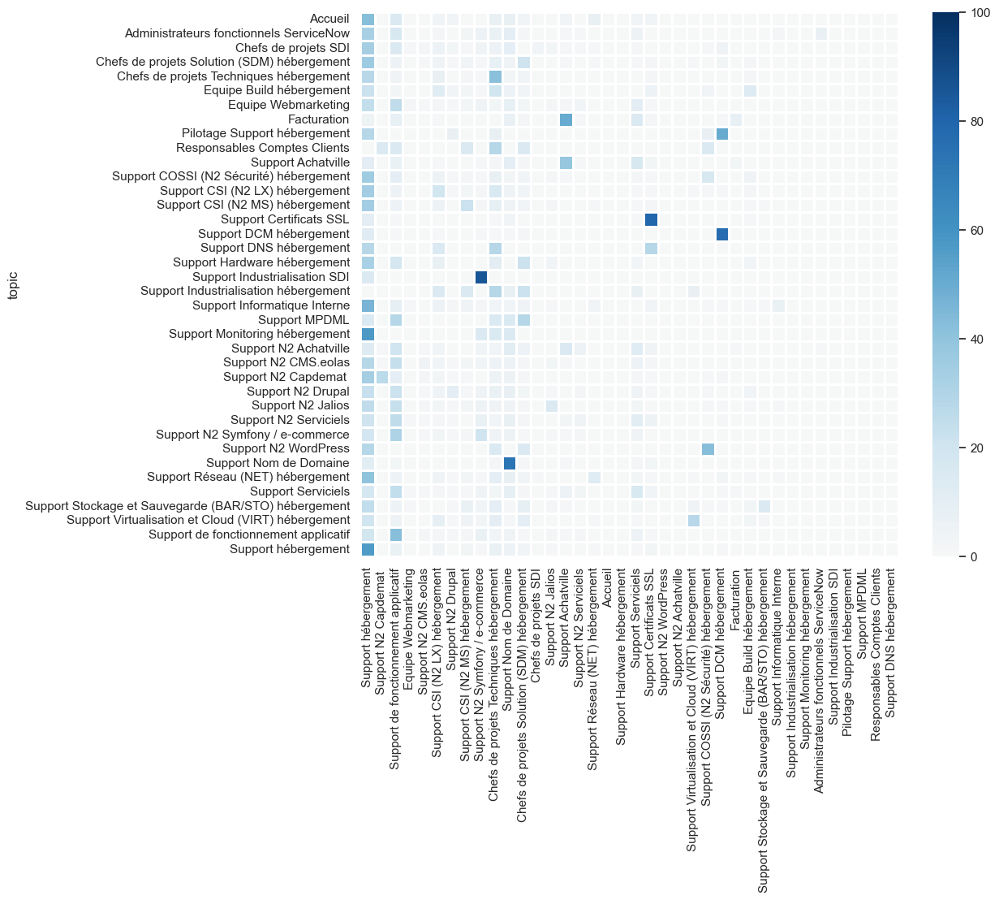

In [91]:
# Affichage de la matrice précédente en forme de heatmap

# La classe qui absorbe la majorité des autres est la classe Support Hebergement

# Support AchatVille et facturation peuvent etre associées

sns.set(rc={'figure.figsize':(10.7,8.7)})
sns.heatmap(df_t_gb , 
            center = 0,
            cmap = 'RdBu',
            linewidths=1,
            vmin = 0,
            vmax = 100);

In [92]:
# Reperons les classes dont les tickets les plus proches appartienent à cette classe.

In [93]:
dico_proximite_classes = {}
dico_same = {}

for ass_group , value in  df_t_gb.iterrows():
    dico_proximite_classes[ass_group] = df_t_gb.columns[np.argmax(value)]
    
print(dico_proximite_classes)

i = 0
for key , value in dico_proximite_classes.items():
    if key == value:
        i = i+1
        dico_same[key] = value
        
print('\n')
print('nombre de classes dont les tickets sont proches entre eux en majorite : ' , i)
print('\n')
print(dico_same)

{'Accueil': 'Support hébergement', 'Administrateurs fonctionnels ServiceNow': 'Support hébergement', 'Chefs de projets SDI': 'Support hébergement', 'Chefs de projets Solution (SDM) hébergement': 'Support hébergement', 'Chefs de projets Techniques hébergement': 'Chefs de projets Techniques hébergement', 'Equipe Build hébergement': 'Support hébergement', 'Equipe Webmarketing': 'Support de fonctionnement applicatif', 'Facturation': 'Support Achatville', 'Pilotage Support hébergement': 'Support DCM hébergement', 'Responsables Comptes Clients': 'Chefs de projets Techniques hébergement', 'Support Achatville': 'Support Achatville', 'Support COSSI (N2 Sécurité) hébergement': 'Support hébergement', 'Support CSI (N2 LX) hébergement': 'Support hébergement', 'Support CSI (N2 MS) hébergement': 'Support hébergement', 'Support Certificats SSL': 'Support Certificats SSL', 'Support DCM hébergement': 'Support DCM hébergement', 'Support DNS hébergement': 'Support hébergement', 'Support Hardware hébergeme

In [94]:
df = pd.DataFrame.from_dict(dico_proximite_classes , orient = 'index').reset_index()\
                                                                      .set_axis(['assignment_group',
                                                                                 'classe_plus_proxhe'] ,
                                                                                axis = 1)

df.head()

,assignment_group,classe_plus_proxhe
0,Accueil,Support hébergement
1,Administrateurs fonctionnels ServiceNow,Support hébergement
2,Chefs de projets SDI,Support hébergement
3,Chefs de projets Solution (SDM) hébergement,Support hébergement
4,Chefs de projets Techniques hébergement,Chefs de projets Techniques hébergement


In [95]:
df.groupby(['classe_plus_proxhe'])['assignment_group'].count().sort_values(ascending = False)

classe_plus_proxhe
Support hébergement                                   19
Support de fonctionnement applicatif                   7
Chefs de projets Techniques hébergement                3
Support Achatville                                     2
Support DCM hébergement                                2
Support COSSI (N2 Sécurité) hébergement                1
Support Certificats SSL                                1
Support N2 Symfony / e-commerce                        1
Support Nom de Domaine                                 1
Support Virtualisation et Cloud (VIRT) hébergement     1
Name: assignment_group, dtype: int64

In [96]:
# Les plus grosses classes restent ==> Normal.

donnees_totales[donnees_totales.assignment_group.isin(dico_same.keys())].assignment_group.value_counts()

Support hébergement                                   2928
Support de fonctionnement applicatif                  1307
Chefs de projets Techniques hébergement                850
Support Nom de Domaine                                 781
Support Certificats SSL                                603
Support DCM hébergement                                279
Support Achatville                                     135
Support Virtualisation et Cloud (VIRT) hébergement      59
Name: assignment_group, dtype: int64

In [97]:
# Les plus petites vont etre agreges

# Support Industrialisation SDI  va s'ajouter à la classe Support N2 Symfony / e-commerce.
# Facturation va s'ajouter à la classe Support AchatVille
# Support N2 WordPress va s'ajouter à la classe Support COSSI (N2 Sécurité) hébergement
# 

donnees_totales[~donnees_totales.assignment_group.isin(dico_same.keys())].assignment_group.value_counts()

Support CSI (N2 LX) hébergement                         406
Support N2 Symfony / e-commerce                         314
Chefs de projets Solution (SDM) hébergement             314
Support Serviciels                                      303
Support CSI (N2 MS) hébergement                         218
Support N2 Jalios                                       140
Support N2 CMS.eolas                                    100
Support N2 Drupal                                        90
Support COSSI (N2 Sécurité) hébergement                  89
Support Réseau (NET) hébergement                         85
Equipe Build hébergement                                 81
Support N2 Serviciels                                    80
Support N2 Capdemat                                      63
Equipe Webmarketing                                      39
Chefs de projets SDI                                     28
Administrateurs fonctionnels ServiceNow                  21
Support Stockage et Sauvegarde (BAR/STO)

In [98]:
Autres = ['Support Hardware hébergement',
          'Accueil',
          'Pilotage Support hébergement',
          'Support Industrialisation hébergement',
          'Responsables Comptes Clients',
          'Support MPDML',
          'Support N2 WordPress',
          'Support Industrialisation SDI',
          'Support Monitoring hébergement',
          'Support DNS hébergement']

In [99]:
Autres.count('Support DNS hébergement')

1

In [100]:
donnees_totales['assignment_group_2'] = donnees_totales.assignment_group.apply(lambda x : "Support Achatville" if x == "Facturation" else x)
donnees_totales['assignment_group_2'] = donnees_totales.assignment_group_2.apply(lambda x : "Support COSSI (N2 Sécurité) hébergement" if x == "Support N2 WordPress" else x)
donnees_totales['assignment_group_2'] = donnees_totales.assignment_group_2.apply(lambda x : "Support N2 Symfony / e-commerce" if x == "Support Industrialisation SDI" else x)

donnees_totales['assignment_group_2'] = donnees_totales.assignment_group_2.apply(lambda x : "Autre" if Autres.count(x) == 1 else x)

In [101]:
donnees_totales[['assignment_group','assignment_group_2']].head()

,assignment_group,assignment_group_2
0,Support hébergement,Support hébergement
1,Support N2 Capdemat,Support N2 Capdemat
2,Support de fonctionnement applicatif,Support de fonctionnement applicatif
3,Support de fonctionnement applicatif,Support de fonctionnement applicatif
4,Equipe Webmarketing,Equipe Webmarketing


In [102]:
(donnees_totales.assignment_group.nunique() , donnees_totales.assignment_group_2.nunique())

(38, 28)

In [103]:
# Separation variables explicatives et variable cible

X = donnees_totales.drop(['assignment_group','assignment_group_2'] , axis = 1).values
y = donnees_totales.assignment_group_2.values

In [140]:
# Nombre d'enregistrements par assignment_group_2

donnees_totales.assignment_group_2.value_counts()

Support hébergement                                     2928
Support de fonctionnement applicatif                    1307
Chefs de projets Techniques hébergement                  850
Support Nom de Domaine                                   781
Support Certificats SSL                                  603
Support CSI (N2 LX) hébergement                          406
Support N2 Symfony / e-commerce                          315
Chefs de projets Solution (SDM) hébergement              314
Support Serviciels                                       303
Support DCM hébergement                                  279
Support CSI (N2 MS) hébergement                          218
Support Achatville                                       150
Support N2 Jalios                                        140
Support N2 CMS.eolas                                     100
Support N2 Drupal                                         90
Support COSSI (N2 Sécurité) hébergement                   90
Support Réseau (NET) héb

In [104]:
# Nombre d'enregistrements par assignment_group

donnees_totales.assignment_group.value_counts()

Support hébergement                                     2928
Support de fonctionnement applicatif                    1307
Chefs de projets Techniques hébergement                  850
Support Nom de Domaine                                   781
Support Certificats SSL                                  603
Support CSI (N2 LX) hébergement                          406
Support N2 Symfony / e-commerce                          314
Chefs de projets Solution (SDM) hébergement              314
Support Serviciels                                       303
Support DCM hébergement                                  279
Support CSI (N2 MS) hébergement                          218
Support N2 Jalios                                        140
Support Achatville                                       135
Support N2 CMS.eolas                                     100
Support N2 Drupal                                         90
Support COSSI (N2 Sécurité) hébergement                   89
Support Réseau (NET) héb

In [105]:
# Donnees d'entrainement vs donnees de test

X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 123)
print('train :' ,X_train.shape , y_train.shape)
print('test :'  ,X_test.shape , y_test.shape)

train : (7512, 3255) (7512,)
test : (1879, 3255) (1879,)


In [106]:
# Regression logistique avec parametres par defaut pour avoir une premiere idée des performances de la classification

reg_log = LogisticRegression(multi_class='multinomial', 
                             solver = 'saga')
reg_log.fit(X_train , y_train)

LogisticRegression(multi_class='multinomial', solver='saga')

In [107]:
# Prediction sur nos donnees de test

y_pred = reg_log.predict(X_test)

In [108]:
# Classification report

print(classification_report(y_test, y_pred))

                                                      precision    recall  f1-score   support

             Administrateurs fonctionnels ServiceNow       0.00      0.00      0.00         3
                                               Autre       0.00      0.00      0.00         4
                                Chefs de projets SDI       0.00      0.00      0.00         3
         Chefs de projets Solution (SDM) hébergement       0.35      0.18      0.24        73
             Chefs de projets Techniques hébergement       0.49      0.39      0.44       178
                            Equipe Build hébergement       0.50      0.10      0.17        10
                                 Equipe Webmarketing       0.00      0.00      0.00        11
                                  Support Achatville       0.71      0.55      0.62        31
             Support COSSI (N2 Sécurité) hébergement       0.60      0.16      0.25        19
                     Support CSI (N2 LX) hébergement       

In [109]:
# Les trois classes les mieux classées f1-score >= 0.80

# Support Certificats SSL 
# Support DCM hébergement
# Support Nom de Domaine

# Les deux plus grosses classes ont un f1-score moyen = 0.60

In [110]:
print(balanced_accuracy_score(y_test, y_pred))

0.2664345089185694


#### Regarder les variances au seins des trois plus gros groupes

In [111]:
# Ces variables vont etres les plus importantes car on fait la moyenne
# Quelques enregistrements < 25% ont de fortes valeurs mais 75% des donnees ont 0.0 en importance tfidf
# Les ecart-types sont tres grands

In [112]:
donnees_totales.loc[(donnees_totales.assignment_group == 'Support hébergement') ,
                    most_important_words['Support hébergement']]\
               .describe()

,serveur,adresse_ip,acce,adresse_mail,service,production,adresse_ip adresse_ip,systeme_information,vpn,port,connexion,eddv,accès,erreur,preproduction
count,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000,2928.000000
mean,0.810370,0.765505,0.690649,0.596130,0.493393,0.458797,0.440112,0.432100,0.412456,0.408962,0.405558,0.356902,0.348098,0.344204,0.309356
std,1.174095,1.224470,1.264438,1.174441,1.186172,1.092634,1.164626,1.018165,1.237111,1.197326,1.134255,1.054557,1.157298,1.056609,0.999612
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.510861,2.723448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2.510861,2.723448,3.004786,2.909117,3.344108,3.060040,3.520896,2.830401,4.121748,3.913203,3.576731,3.471790,4.194370,3.586583,3.538264


In [113]:
donnees_totales.loc[(donnees_totales.assignment_group == 'Support de fonctionnement applicatif') ,
                    most_important_words['Support de fonctionnement applicatif']]\
               .describe()

,page,command,adresse_mail,erreur,produire,systeme_information,code,message,fonctionnement,modification,information,office,gt,commande,back office
count,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000
mean,0.756388,0.500758,0.458514,0.417108,0.389158,0.387637,0.371091,0.347015,0.339960,0.335820,0.313176,0.311978,0.308350,0.300679,0.282930
std,1.469217,1.355791,1.060423,1.150229,1.297150,0.973464,1.212612,1.133938,1.144757,1.092032,0.954979,1.238851,1.101793,1.210573,1.208166
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3.608028,4.168728,2.909117,3.586583,4.709534,2.830401,4.330502,4.049539,4.191776,3.884215,3.223001,5.227633,4.242252,5.170880,5.438083


In [114]:
donnees_totales.loc[(donnees_totales.assignment_group == 'Chefs de projets Techniques hébergement') ,
                    most_important_words['Chefs de projets Techniques hébergement']]\
               .describe()

,creneau,comprehension,linux,serveur linux,serveur,contrôle,linux contrat,prerequi,redemarrage serveur,systeme_information probleme,contrat hebergement,prerequi patch,procederon creneau,probleme capacité,creneau systeme_information
count,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000
mean,1.269970,1.247795,1.242354,1.239957,1.228845,1.228789,1.226938,1.226635,1.224257,1.221361,1.219996,1.218094,1.218094,1.218094,1.218094
std,2.014156,2.037742,2.016895,2.074080,1.255888,2.055399,2.077481,2.064307,2.023281,2.074399,2.059412,2.075233,2.075233,2.075233,2.075233
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.460638,4.571664,4.512824,4.705196,2.510861,4.662817,4.740442,4.696575,4.564117,4.740442,4.692292,4.749451,4.749451,4.749451,4.749451
max,4.460638,4.571664,4.512824,4.705196,2.510861,4.662817,4.740442,4.696575,4.564117,4.740442,4.692292,4.749451,4.749451,4.749451,4.749451


In [115]:
donnees_totales.loc[(donnees_totales.assignment_group == 'Support Stockage et Sauvegarde (BAR/STO) hébergement') ,
                    most_important_words['Support Stockage et Sauvegarde (BAR/STO) hébergement']]\
               .describe()

,backup,sauvegarde,sauvegard,ecran,machine_virtuelle,démontage,systeme_information,message,machine,datastore,nuit,vm,espace disque,pdwv,commencer
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,2.097519,1.635734,1.351836,1.182108,1.028405,0.955779,0.893811,0.852535,0.764107,0.763920,0.713683,0.700116,0.696974,0.690957,0.688073
std,2.821552,2.812109,2.324041,2.351871,2.046069,2.267762,1.351706,1.696165,1.812985,2.288221,1.693344,2.097105,2.087693,2.069671,2.061032
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5.693266,3.107894,2.568489,0.000000,0.000000,0.000000,2.830401,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.693266,6.215788,5.136978,5.615014,4.884923,6.053269,2.830401,4.049539,4.839346,7.257242,4.519992,6.651106,6.621253,6.564095,6.536696


#### Tentons une TruncatedSVD pour la reduction de dimension avant les k-means pour redefinir les classes

#### -+ K-means sans reduction de dimension

#### -+ Reduction de dimension avec SVD

In [116]:
# taille de notre dataset 
# K-means pas tres efficace avec trop de variables
# ==> Pensons à la réduction de dimension

tfidf_data.shape

(9391, 3255)

In [117]:
X = csr_matrix(tfidf_data)

In [118]:
# Model SVD pour la reduction de dimension

model_svd = TruncatedSVD(X.shape[1]-1)
tfiff_data_svd = model_svd.fit_transform(X)

In [119]:
svd_var_ratios = model_svd.explained_variance_ratio_

In [120]:
# Fonction qui ne renvoit que les x premiers axes qui portent var_ratio de l'inertie

def select_n_components(var_ratio, goal_var: float) -> int:
    # Set initial variance explained so far
    total_variance = 0.0
    
    # Set initial number of features
    n_components = 0
    
    # For the explained variance of each feature:
    for explained_variance in var_ratio:
        
        # Add the explained variance to the total
        total_variance += explained_variance
        
        # Add one to the number of components
        n_components += 1
        
        # If we reach our goal level of explained variance
        if total_variance >= goal_var:
            # End the loop
            break
            
    # Return the number of components
    return n_components

In [121]:
# Les 1763 premiers axes portent 95% d'inertie
# Toujours un grand nombre de variables
# Tentons tout de même le k-means

select_n_components(svd_var_ratios, 0.95)

1766

In [122]:
model_svd = TruncatedSVD(1763)
tfidf_data_svd = model_svd.fit_transform(X)

In [123]:
tfidf_data_svd

array([[ 1.34002362e+00, -1.49684258e-01,  2.28525273e+00, ...,
         1.63118282e-01,  5.89445013e-01,  1.61301022e-01],
       [ 3.44791856e-01,  3.88914578e-02,  1.19452055e+00, ...,
         2.09410359e-01,  1.36632206e-01,  2.57111772e-01],
       [ 3.22572557e-02,  2.99245043e-02,  3.92618423e-01, ...,
         8.87894253e-04, -1.60026909e-01,  2.94810815e-01],
       ...,
       [ 5.34580641e-01,  6.94980879e-01,  1.46456275e+00, ...,
        -1.13477271e-02, -1.61254303e-01,  1.38365270e-01],
       [ 6.32817449e-03,  5.02444991e-03,  5.49486051e-02, ...,
        -9.49923661e-02,  1.47613329e-01,  2.57877747e-02],
       [ 5.28958301e-01,  1.23478933e+00,  7.37783646e-01, ...,
        -2.42414698e-02,  3.63337515e-01,  1.42662261e-01]])

In [124]:
#plt.plot(range(model_acp.n_components_) , model_acp.explained_variance_ratio_.cumsum() , '*')
#plt.xlabel('Composantes principales')
#plt.ylabel('Pourcentage de variances expliquées')
#plt.xticks(range(model_acp.n_components_)[:101])
#plt.show()

#### -+ Testons un clustering avec du k-means

In [125]:
sns.set(rc={'figure.figsize':(11.7,6.27)})

In [126]:
# On stocke pour chaque nombre de cluster l'homogeneity avec les assignment_group predefinis ainsi que la part d'inertie intra classe

homogeneity = []
inertia = []
for num_cluster in range(2,25):
    km = MiniBatchKMeans(n_clusters = num_cluster, 
                         max_iter = 100000,
                         batch_size=1000)
    km.fit(tfidf_data_svd)
    labels_pred = km.predict(tfidf_data_svd)
    inertia.append(km.inertia_)
    homogeneity.append(metrics.homogeneity_score(labels, labels_pred))

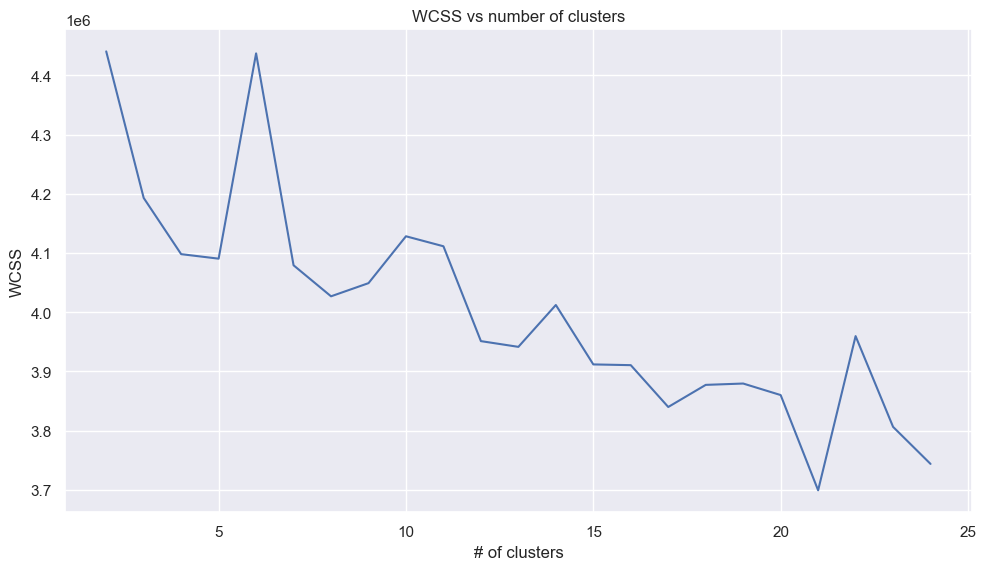

In [127]:
# Affichage de l'inertie intra classe en fonction du nombre de cluster

plt.plot(range(2,25), inertia)
plt.title('WCSS vs number of clusters')
plt.ylabel('WCSS')
plt.xlabel('# of clusters')
plt.show()

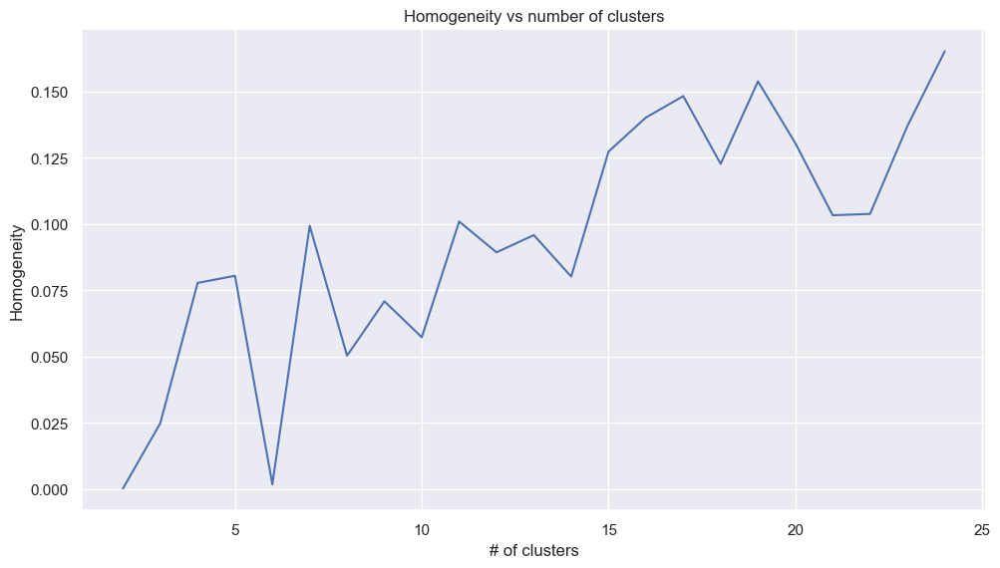

In [128]:
# Affichage de l'homogeneiteentre en fonction du nombre de cluster entre les clusters et les assignment_group predefinis

plt.plot(range(2,25), homogeneity)
plt.title('Homogeneity vs number of clusters')
plt.ylabel('Homogeneity')
plt.xlabel('# of clusters')
plt.show()

In [129]:
# Clustering avec un nombre de clusters choisi

km = MiniBatchKMeans(n_clusters = 15, 
                     max_iter = 100000,
                     batch_size=1000)
    
km.fit(tfidf_data_svd)

MiniBatchKMeans(batch_size=1000, max_iter=100000, n_clusters=15)

In [130]:
# Prediction des nouveaux clusters

labels_pred = km.predict(tfidf_data_svd)

In [131]:
# Donnees totales pour pouvoir filtrer par cluster et analyser chaque cluster

donnees_totales_3 = pd.concat([donnees_totales , 
                               pd.DataFrame({'km_cluster': labels_pred}).reset_index(drop = True)] , 
                              axis = 1)
donnees_totales_3.head()

,abandonner,abonnemer,abonnemer domaine,abonnemer lien,abord,aboutir,abr,absent,absolument,acce,acce acce,acce adresse,acce adresse_ip,acce adresse_mail,acce centre,acce centreon,acce conduent,acce denied,acce environnement,acce fonctionnement,acce fonctionnemer,acce ftp,acce identifier,acce information,acce interfac,acce internet,acce open,acce page,acce phpmyadmin,acce plateform,acce preproduction,acce production,acce rdp,acce renovation,acce ressource,acce saphir,acce serveur,acce service,acce sftp,acce societe,acce ssh,acce vpn,acceptation,acceptation party,acceptation risque,accompagnement,accompagner,accorder,account,accè,accèder,accès,accès environnement,accès ftp,accès preproduction,accès serveur,accéder,acem,achat,achatvill,acl,acquérir,acte,actif,actif eddv,actif pddv,activation,activer,activité,actu,actualiser,actualite,actuel,adapter,add,address,adherent,adherer,administration,administration serveur,adobe,adress,adress adresse_ip,adress adresse_mail,adresse,adresse adresse_ip,adresse adresse_mail,adresse_ip,adresse_ip acce,adresse_ip accès,adresse_ip adresse_ip,adresse_ip adresse_mail,adresse_ip autorisation,adresse_ip autoriser,adresse_ip changemer,adresse_ip connexion,adresse_ip domaine,adresse_ip eddv,adresse_ip edwv,adresse_ip effectif,adresse_ip enregistremer,adresse_ip erreur,adresse_ip fixe,adresse_ip gt,adresse_ip hostname,adresse_ip identifiant,adresse_ip information,adresse_ip machine_virtuelle,adresse_ip pddv,adresse_ip phpmyadmin,adresse_ip port,adresse_ip preproduction,adresse_ip prestataire,adresse_ip principal,adresse_ip priv,adresse_ip production,adresse_ip protocole,adresse_ip pub,adresse_ip public,adresse_ip remplacement,adresse_ip serveur,adresse_ip service,adresse_ip systeme_information,adresse_ip vpn,adresse_mail,adresse_mail acce,adresse_mail accès,adresse_mail administration,adresse_mail adresse,adresse_mail adresse_ip,adresse_mail adresse_mail,adresse_mail arriver,adresse_mail associer,adresse_mail certificat,adresse_mail changemer,adresse_mail command,adresse_mail dns,adresse_mail domaine,adresse_mail ecommerce,adresse_mail envoyer,adresse_mail erreur,adresse_mail gt,adresse_mail information,adresse_mail message,adresse_mail passer,adresse_mail serveur,adresse_mail spam,adresse_mail systeme_information,adresser,adulte,aefe,affecter,affecté,affichent,afficher,after,again,agence,agir,agréable,aider,aimer,aimerai,ain,air,ajout,ajout adresse_ip,ajout disque,ajout filtrage,ajout nomvlan,ajouter,ajuster,alerter,alfresco,algorithm,algorithm encodage,algorithme,algorithme encodage,alias,alimentation,alimenter,aller,aller page,allocation,allocation monitoring,allocation partition,allow,allsyst,allsyst adresse_ip,alt,alternatif,aléatoire,amelioration,amont,amont pouvoir,amp,amp amp,améliorer,anahfr,ancien,andré,andré woisard,anglais,annonce,annoncer,annuel,annulation,annuler,annulion,annulion explicite,année,anomalie,anomaly,anomaly réagission,anormal,ansibl,antispam,antiviru,antiviru sonde,antivirus,antivirus viser,any,any adresse_ip,aout,août,apache,apache availabl,apache vitrine,apercevoir,api,apidae,apm,apparaitre,apparaître,apparemment,appartemer,appartemer manuellemer,appartenir,appel,appeler,appli,applicable,applicatif,applicatif charge,applicatif entrainer,applicatif système,application,application firewall,application mobile,application production,...,toucher,toupargel,tourn,tourner,toutefois,toutefois constater,toutefois fassion,trac,trac derogation,trafic,train,traite,traitement,traiter,tranch,transaction,transferer,transferer gestion,transfert,transfert domaine,transférer,transféron,transféron exister,transmet,transmission,transmission lancion,transmission monitoring,transport,travail,travailler,travaillon,traval,travers,tri,trois,trouver,true,try,tse,ttl,tue,tue bandotheque,tue cartouch,typo,typo php,tâche,téléchargement,téléchargemer,téléchargemer installation,télécharger,téléphonique,téléservic,télétravail,tôt,udp,ulterieurement,ulterieurement hebergement,unabl,unavailabl,unavailabl se

In [132]:
donnees_totales_3.isna().sum()

abandonner            0
abonnemer             0
abonnemer domaine     0
abonnemer lien        0
abord                 0
                     ..
être necessaire       0
être titulaire        0
assignment_group      0
assignment_group_2    0
km_cluster            0
Length: 3258, dtype: int64

In [133]:
# Nombre d'elements par cluster

donnees_totales_3.km_cluster.value_counts()

11    7916
3      325
12     312
0      229
5      220
9      155
2       94
7       77
10      38
6       14
1        4
14       3
4        2
13       1
8        1
Name: km_cluster, dtype: int64

In [134]:
donnees_totales_3.assignment_group.value_counts()

Support hébergement                                     2928
Support de fonctionnement applicatif                    1307
Chefs de projets Techniques hébergement                  850
Support Nom de Domaine                                   781
Support Certificats SSL                                  603
Support CSI (N2 LX) hébergement                          406
Support N2 Symfony / e-commerce                          314
Chefs de projets Solution (SDM) hébergement              314
Support Serviciels                                       303
Support DCM hébergement                                  279
Support CSI (N2 MS) hébergement                          218
Support N2 Jalios                                        140
Support Achatville                                       135
Support N2 CMS.eolas                                     100
Support N2 Drupal                                         90
Support COSSI (N2 Sécurité) hébergement                   89
Support Réseau (NET) héb

In [135]:
#donnees_totales_3[donnees_totales_3.km_cluster == 0]

In [136]:
#data_prepared[data_prepared.assignment_group == 'Support de fonctionnement applicatif'].shape

In [137]:
# Pour la classification on vire les clusters avec moins de deux elements

donnees_totales_3 = donnees_totales_3[~donnees_totales_3.km_cluster.isin([0 , 6])]
donnees_totales_3.km_cluster.value_counts()

11    7916
3      325
12     312
5      220
9      155
2       94
7       77
10      38
1        4
14       3
4        2
13       1
8        1
Name: km_cluster, dtype: int64

#### -+ Classification supervisee

In [138]:
# Variable cible vs Variables explicatives

X = donnees_totales_3.drop(['km_cluster','assignment_group'] , axis = 1)
y = donnees_totales_3['km_cluster']

In [139]:
# Train data set vs test data set

X_train , X_test , y_train , y_test = train_test_split(X , 
                                                       y , 
                                                       test_size = 0.2 ,
                                                       stratify = y)
print('train :' ,X_train.shape , y_train.shape)
print('test :'  ,X_test.shape , y_test.shape)

ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

In [ ]:
# On teste une regression logistique avec les parametres par defaut

clf = LogisticRegression(multi_class='multinomial', solver = 'saga')

In [ ]:
clf.fit(X_train , y_train)

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
balanced_accuracy_score(y_test , y_pred)

In [ ]:
cf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
sns.heatmap(cf_matrix , annot = True);

In [ ]:
#importance_des_variables = pd.DataFrame({'variable' : X.columns, 
#                                         'importance' : clf.feature_importances_})\
#                           .sort_values(by = 'importance' , ascending = False)\
#                           .reset_index(drop = True)
#
#importance_des_variables.head(10)

In [ ]:
#sns.barplot(x = importance_des_variables.head(30)['variable'], 
#            y = importance_des_variables.head(30)['importance'])

#plt.xticks(rotation = 90)
#plt.show()

#### Regarder le taux de couverture des labels par rapport aux clusters definis

In [ ]:
sns.heatmap(pd.crosstab(donnees_totales_3['assignment_group'],
                        donnees_totales_3['km_cluster']).apply(lambda x : x/sum(x)*100 , axis = 1));

In [ ]:
# ==> La plupart de nos donnees sont regroupes dans une seule classe, 
# malgre la reduction de dimension il reste toujours trop de variablespour que le k-mean soit performant

In [ ]:
df = pd.DataFrame(donnees_totales_3[donnees_totales_3.km_cluster == 0].drop(['km_cluster','assignment_group'] , axis = 1).mean(0).sort_values(ascending = False)).reset_index()
df.columns = ['word', 'count']
df['x_axis'] = np.arange(0, len(df))

gg_word_importance(df, 
                   x = 'word')

#### Tentons avec doc2vec pour vectoriser notre text avant de tester le k-means

#### -+ Doc2vec

In [ ]:
# Initialisation du modele avec un choix arbitraire de 110 dimensions (mediane du nombre de tokens par assignment_group)

model = Doc2Vec(vector_size=110, 
                window=2, 
                min_count=1, 
                workers=4)

In [ ]:
data = data_prepared['stem_text'].values
data

In [ ]:
data.size

In [ ]:
# Tagguer les donnees pour qu'il puisse etre ingérer par le modele

tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), 
                              tags=[str(i)]) 
               for i, _d in enumerate(data)]

In [ ]:
model.build_vocab(tagged_data)

In [ ]:
# Entrainement du modele sur 100 epochs

max_epochs = 100
alpha = 0.25

for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(tagged_data,
                total_examples=model.corpus_count,
                epochs=model.epochs)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha

In [ ]:
arr = model.docvecs[0]
for i in range(1,data_prepared.shape[0]):
    arr = np.vstack((arr , model.docvecs[i]))
    
arr

In [ ]:
# Nos donnees vectorises sur 110 dimensions

df = pd.DataFrame(arr)
df.head()

In [ ]:
df.shape

In [ ]:
labels.size

In [ ]:
data_prepared.shape

In [ ]:
homogeneity2 = []
inertia2 = []
v_mesure2 = []
for num_cluster in range(2,25):
    km2 = MiniBatchKMeans(n_clusters = num_cluster, 
                          max_iter = 100000,
                          batch_size=1000)
    km2.fit(df)
    labels_pred = km2.predict(df)
    inertia2.append(km2.inertia_)
    homogeneity2.append(metrics.homogeneity_score(labels, labels_pred))
    v_mesure2.append(metrics.v_measure_score(labels, labels_pred))

In [ ]:
plt.plot(range(2,25), inertia2)
plt.title('WCSS vs number of clusters')
plt.ylabel('WCSS')
plt.xlabel('# of clusters')
plt.show()

In [ ]:
plt.plot(range(2,25), homogeneity2)
plt.title('Homogeneity vs number of clusters')
plt.ylabel('Homogeneity')
plt.xlabel('# of clusters')
plt.show()

In [ ]:
plt.plot(range(2,25), v_mesure2)
plt.title('V-measure vs number of clusters')
plt.ylabel('V-measure')
plt.xlabel('# of clusters')
plt.show()

In [ ]:
km2 = MiniBatchKMeans(n_clusters = 15, 
                      max_iter = 100000,
                      batch_size=1000)
    
km2.fit(df)

In [ ]:
labels_pred = km2.predict(df)

In [ ]:
donnees_totales_4 = pd.concat([df , 
                               pd.DataFrame({'km_cluster_2': labels_pred}).reset_index(drop = True)] , 
                              axis = 1)
donnees_totales_4.head()

In [ ]:
donnees_totales_4.isna().sum()

In [ ]:
donnees_totales_4.km_cluster_2.value_counts()

In [ ]:
X = donnees_totales_4.drop(['km_cluster_2'] , axis = 1)
y = donnees_totales_4['km_cluster_2']

In [ ]:
X_train , X_test , y_train , y_test = train_test_split(X , 
                                                       y , 
                                                       test_size = 0.2 ,
                                                       stratify = y)
print('train :' ,X_train.shape , y_train.shape)
print('test :'  ,X_test.shape , y_test.shape)

In [ ]:
clf = LogisticRegression(multi_class='multinomial', solver = 'saga')
#reg_log.fit(X_train , y_train)

In [ ]:
#clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(X_train , y_train)

In [ ]:
#y_pred = reg_log.predict(X_test)
y_pred = clf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
balanced_accuracy_score(y_test , y_pred)

In [ ]:
cf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
sns.heatmap(cf_matrix , annot = True);

In [ ]:
print('completeness score k-means labels vs true labels : {}'.format(metrics.completeness_score(labels , labels_pred)))
print('homogeneity score k-means labels vs true labels : {}'.format(metrics.homogeneity_score(labels,labels_pred)))
print('V-measure score k-means labels vs true labels : {}'.format(metrics.v_measure_score(labels,labels_pred)))

#### Analyse des clusters obtenus par k-means apres Doc2vec

In [ ]:
sns.heatmap(pd.crosstab(labels,
                        labels_pred).apply(lambda x : x/sum(x)*100 , axis = 1));

In [ ]:
plotnine.options.figure_size = (16, 5.5) 

out = pd.concat([tfidf_data.reset_index(drop = True),
                 pd.DataFrame({'km_cluster' : labels_pred}).reset_index(drop = True)] , axis = 1)
print(out.shape)
out.head()

for cluster in out.km_cluster:
    df = out[out.km_cluster == cluster]
    df = pd.DataFrame(df.mean(0).sort_values(ascending = False)).reset_index()
    df.columns = ['word', 'count']
    df['x_axis'] = np.arange(0, len(df))

    #print(df.head(1))
    #break;
    
    print(gg_word_importance(df, 
                             x = 'word'))

In [ ]:
"""importance_des_variables = pd.DataFrame({'variable' : X.columns, 
                                         'importance' : clf.feature_importances_})\
                           .sort_values(by = 'importance' , ascending = False)\
                           .reset_index(drop = True)

importance_des_variables.head(10)"""

In [ ]:
"""sns.barplot(x = importance_des_variables.head(30)['variable'], 
            y = importance_des_variables.head(30)['importance'])

plt.xticks(rotation = 90)
plt.show()"""